# Diffusion mapping of fMRI data
#### Exploring the representation of attention and memory using non-linear dimensionality reduction 

In [1]:
# Preparing inputs, variables, and data

import numpy as np # scientific computing 
import scipy.io
from scipy import stats
from scipy.spatial.distance import pdist, squareform
from scipy.sparse.linalg import eigs
from sklearn import linear_model
from sklearn import svm 
from sklearn.naive_bayes import GaussianNB
import pandas as pd # data manipulation 
import brainiak.funcalign.srm
from brainiak import image, io
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D 
%matplotlib inline 
import time

# descriptive variables for the dataset 
# the data consists of 1976 total TRs (time repetitions, i.e. when a single image was taken) for 17 participants
# taken in 2 separate (but concatenated) runs. 
# experimenters further identified 50 different scenes within this time period, and labelled whether or not
# participants recalled those scenes during a later recall task 
nScenes = 50
nScenes1 = 27
nTRs1 = 946 
nScenes2 = 23
nTRs2 = 1030
n = 17

# for each participant (of 17), let's get the recall data for each of 50 scenes 
# 3 variables (columns): recalled (1/0), quality (0-5), recall time len (0+)
recall_dfs = []
recall_path = "SherlockData/recall_transcripts/"
for pid in range(1, 18):
    filename = "NN_S" + str(pid) + "_Scene_Matches_edit4matlab.xlsx"
    file = pd.read_excel(recall_path + filename)
    file = file.replace(np.nan, -1, regex=True)
    quality = []
    recalled = []
    duration = []
    for s in range(50):
        if file['quality'][s] == -1: # did not recall
            quality.append(0)
            recalled.append(0)
            duration.append(0)
        else:
            quality.append(file['quality'][s])
            recalled.append(1)
            duration.append(file['end time sec'][s] - file['start time sec'][s])
    recall_dfs.append(np.transpose([recalled, quality, duration]))
    
recall_dfs = np.array(recall_dfs)

# Brain data: 17 participants, 26k WB mask voxels, 1976 TRs (time-of-repetition, i.e. one time point/1.5s in this case)
movie_data = []
for pid in range(1, 18):
    moviedat = np.load("SherlockData/movie_masked/movie_wb_S" + str(pid) + ".npz")['data']
    # stored as TR x voxel, but we want voxel x TR data 
    movie_data.append(np.transpose(moviedat))
    
movie_data = np.array(movie_data)

/gpfs/milgram/apps/hpc.rhel7/software/Python/Anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
# zscores each of list of 2D arrays, by row
# For each participant, we want to compare how the voxel activations change over time, 
# rather than the absolute voxel activations 
def zscore(data):
    for pid in range(len(data)):
        data[pid] = np.nan_to_num(stats.zscore(data[pid], axis = 1, ddof = 1))
    return np.array(data)

# Downsampling function (features x TRs -> features x SCENES)
# given data matrix of 1 participant (features x TRs)
# returns a features x SCENEs matrix, where 
# corresponding TRs in a scene are averaged 
# if rh is True, then movie data corresponds to only the right brain and thus we want to 
# add in
movieTRs = np.array(pd.read_csv("movieTRs.csv", index_col = 0))
def scene_voxelavg(dat_tr, startind = 0, endind = nScenes, rh = False):
    dat_sc = []
    for sceneidx in range(startind, endind):
        offset = 1
        if rh:
            offset = offset + nTRs1
        startTR = movieTRs[sceneidx, 1] - offset
        endTR = movieTRs[sceneidx, 2] - offset
        response_avg = np.reshape(np.mean(dat_tr[:,startTR:endTR + 1], axis = 1), (-1, 1))
        if len(dat_sc) == 0:
            dat_sc = response_avg
        else:
            dat_sc = np.append(dat_sc, response_avg, axis = 1)
    return np.array(dat_sc)

# given a participant index and
# recalltype (0 for nRecall, 1 for time of recall, 2 for quality of recall)
# returns a nTRs-len vector representation for recall from start scene index
# i.e. expands a recall outcome vector from length SCENES to TRs
# note that this is a very imprecise way of identifying recall, as it is possible that 
# participants recalled only parts of the scene and not others
def get_recall_labels(pidx, recalltype, startind = 0, endind = nScenes):
    labels_byTR = []
    startTR = movieTRs[startind, 1] - 1 
    for sceneidx in range(startind, endind):
        endTR = movieTRs[sceneidx, 2] - 1 
        labels_byTR = np.append(labels_byTR, 
            np.repeat(recall_dfs[pidx, sceneidx, recalltype], endTR-startTR+1))
        startTR = endTR + 1
    return labels_byTR

In [3]:
# Diffusion Mapping 
# takes data matrix (observations are ROWS), bandwidth, and time
# and returns [map vals] using the first m non-trivial coordinate functions
# and their corresponding eigenvalues 
def diffmap(xs, sigma, t, m):
    dists = squareform(pdist(xs))
    W = np.exp(-1 * np.power(dists, 2) / (2 * np.power(sigma, 2)))
    M = W / np.sum(W, axis = 1)[:, np.newaxis]
    evals, evecs = eigs(M, m + 1)
    evals = np.real(evals[1:(m + 1)])
    evecs = np.real(evecs[:, 1:(m + 1)])
    
    return [evecs * np.power(evals, t), evals]

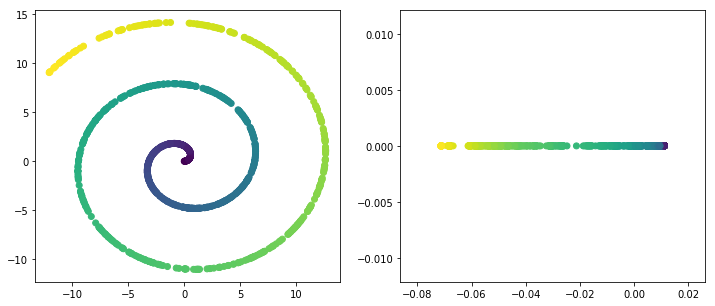

In [4]:
# we'll test this with basic spiral data to confirm the function is working:
spiral = scipy.io.loadmat("spiral.mat")
x = spiral["spiral"]

fig = plt.figure(figsize = [12, 5])
ax = fig.add_subplot(1, 2, 1)
ax.scatter(x[:, 0], x[:, 1], c = np.reshape(spiral['thetas'], -1))

[spiral_map, spiral_vals] = diffmap(x, 1, 1, 1)
ax = fig.add_subplot(1, 2, 2)
ax.scatter(spiral_map[:, 0], np.zeros(1000), c = np.reshape(spiral['thetas'], -1))

## Data exploration 

0 201.0 151.0 [1.    0.289 0.109 0.065 0.056]
0 201.0 176.0 [1.    0.233 0.072 0.048 0.034]
0 201.0 201.0 [1.    0.191 0.051 0.037 0.026]
0 201.0 226.0 [1.    0.158 0.038 0.028 0.021]
0 201.0 251.0 [1.    0.133 0.03  0.021 0.017]
2 213.0 163.0 [1.    0.229 0.087 0.053 0.041]
2 213.0 188.0 [1.    0.183 0.067 0.035 0.031]
2 213.0 213.0 [1.    0.148 0.053 0.025 0.023]
2 213.0 238.0 [1.    0.122 0.043 0.02  0.017]
2 213.0 263.0 [1.    0.103 0.035 0.016 0.014]
4 199.0 149.0 [1.    0.773 0.383 0.276 0.197]
4 199.0 174.0 [1.    0.574 0.215 0.152 0.144]
4 199.0 199.0 [1.    0.373 0.125 0.105 0.069]
4 199.0 224.0 [1.    0.221 0.1   0.051 0.037]
4 199.0 249.0 [1.    0.133 0.081 0.03  0.025]
6 204.0 154.0 [1.    1.    0.527 0.244 0.176]
6 204.0 179.0 [1.    0.992 0.192 0.123 0.071]
6 204.0 204.0 [1.    0.902 0.099 0.073 0.052]
6 204.0 229.0 [1.    0.58  0.081 0.043 0.036]
6 204.0 254.0 [1.    0.252 0.068 0.035 0.024]


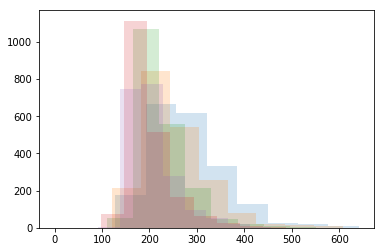

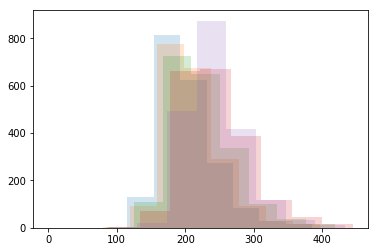

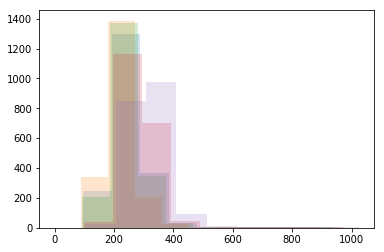

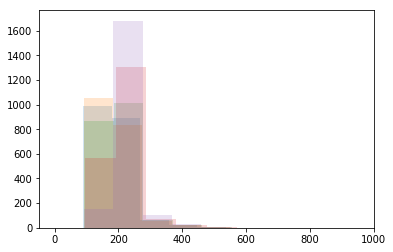

In [5]:
for pid in range(4): # for a few participants, let's look at potential sigma values
    pid = pid * 2
    xs = movie_data[pid].T
    dists = squareform(pdist(xs))
    m = 4
    
    plt.figure()
    for i in range(5):
        plt.hist(dists[i], alpha = 0.2) # try to see a decent range for sigma 
    
    for i in range(-2, 3): # print out eigenvalues per sigma
        sigma = np.round(np.median(dists) + 25 * i)
        W = np.exp(-1 * np.power(dists, 2) / (2 * np.power(sigma, 2)))
        M = W / np.sum(W, axis = 1)[:, np.newaxis]
        evals, evecs = eigs(M, m + 1)
        print(pid, round(np.median(dists)), sigma, np.round(np.real(evals), 3))
# It's interesting that some of the first nontrivial eigenvalues can be as high
# as >.90, while others are around the .10-.30 region...

/gpfs/milgram/apps/hpc.rhel7/software/Python/Anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:138: RuntimeWarning: invalid value encountered in sqrt
  ret = um.sqrt(ret, out=ret)
/gpfs/milgram/apps/hpc.rhel7/software/Python/Anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:2251: RuntimeWarning: divide by zero encountered in true_divide
  np.expand_dims(sstd, axis=axis))
/gpfs/milgram/apps/hpc.rhel7/software/Python/Anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:2251: RuntimeWarning: invalid value encountered in true_divide
  np.expand_dims(sstd, axis=axis))


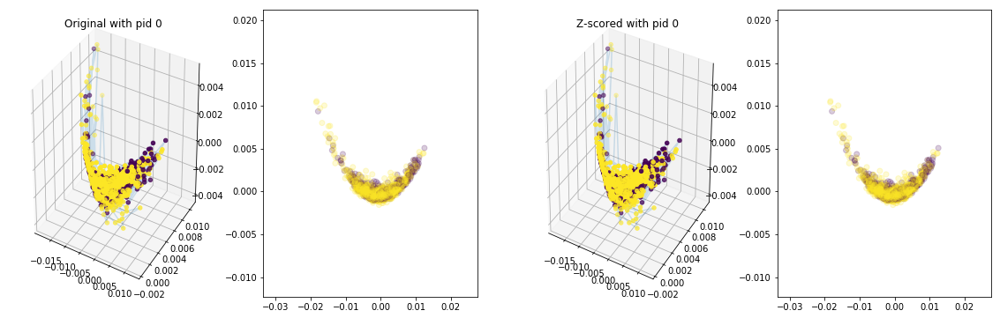

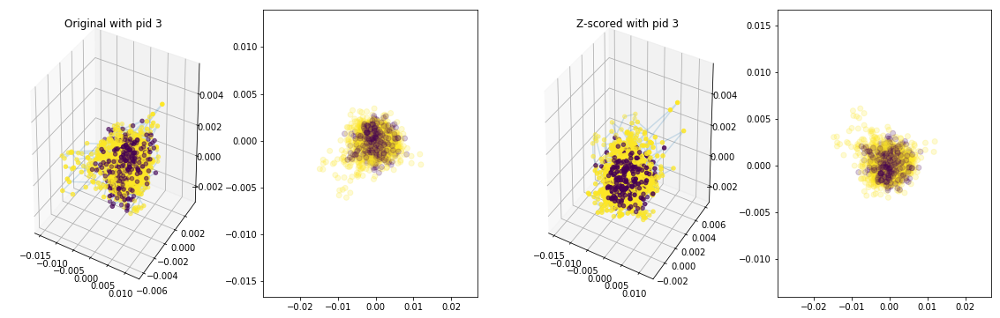

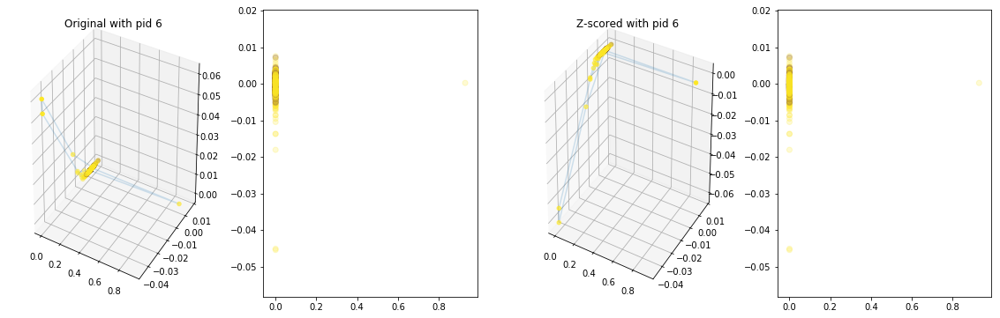

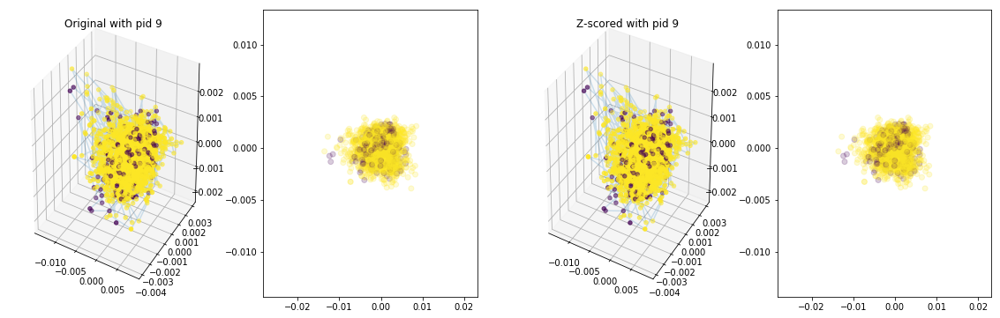

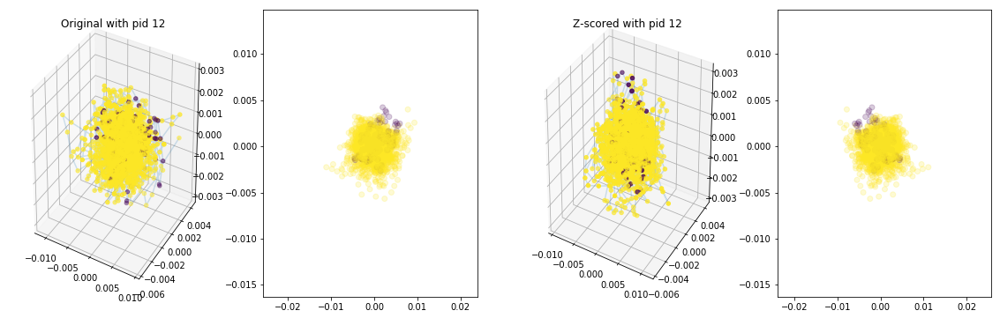

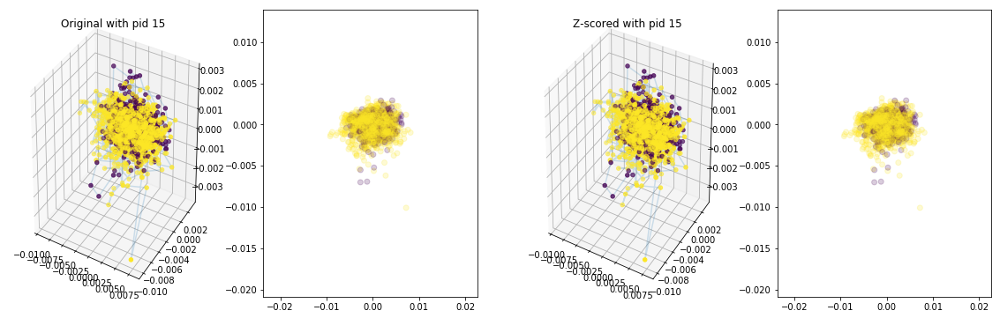

In [6]:
# First we want to see if z-scoring makes a significant difference:
# Usually, we want to z-score for each voxel by time in order to see how voxels differentially activate across time
# rather than absolute activation

for pid in range(round(n/3)): # We'll just try for a few participants to save time...
    pid = pid * 3
    recalled = get_recall_labels(pid, 0)
    fig = plt.figure(figsize= [20, 6])
    
    # Original version 
    dat = movie_data[pid].T
    [dif_map, dif_vals] = diffmap(dat, 200, 1, 4)

    ax = fig.add_subplot(1, 4, 1, projection='3d')
    ax.plot(dif_map[:, 0], dif_map[:, 1], dif_map[:, 2], alpha = 0.2)
    ax.scatter(dif_map[:, 0], dif_map[:, 1], dif_map[:, 2], c = recalled)
    ax.set_title("Original with pid " + str(pid))

    ax = fig.add_subplot(1, 4, 2)
    ax.scatter(dif_map[:, 0], dif_map[:, 1], c = recalled, alpha = 0.2)
    
    # Z-scored version
    dat = zscore(movie_data)[pid].T
    [dif_map, dif_vals] = diffmap(dat, 200, 1, 4)
    
    ax = fig.add_subplot(1, 4, 3, projection='3d')
    ax.plot(dif_map[:, 0], dif_map[:, 1], dif_map[:, 2], alpha = 0.2)
    ax.scatter(dif_map[:, 0], dif_map[:, 1], dif_map[:, 2], c = recalled)
    ax.set_title("Z-scored with pid " + str(pid))

    ax = fig.add_subplot(1, 4, 4)
    ax.scatter(dif_map[:, 0], dif_map[:, 1], c = recalled, alpha = 0.2)

/gpfs/milgram/apps/hpc.rhel7/software/Python/Anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:138: RuntimeWarning: invalid value encountered in sqrt
  ret = um.sqrt(ret, out=ret)
/gpfs/milgram/apps/hpc.rhel7/software/Python/Anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:2251: RuntimeWarning: divide by zero encountered in true_divide
  np.expand_dims(sstd, axis=axis))
/gpfs/milgram/apps/hpc.rhel7/software/Python/Anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:2251: RuntimeWarning: invalid value encountered in true_divide
  np.expand_dims(sstd, axis=axis))


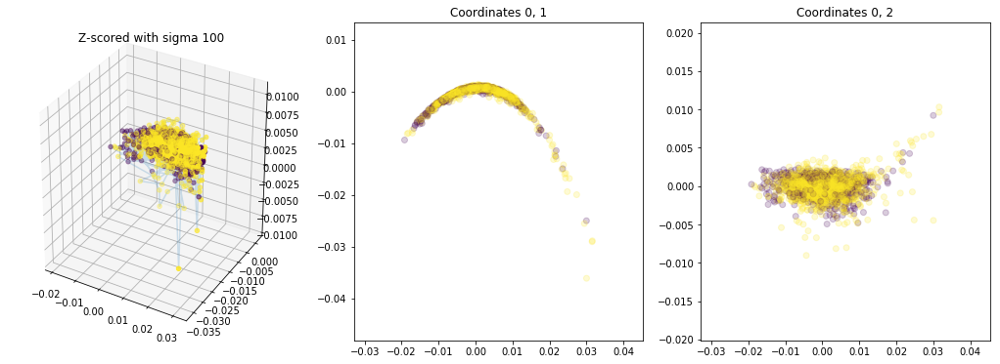

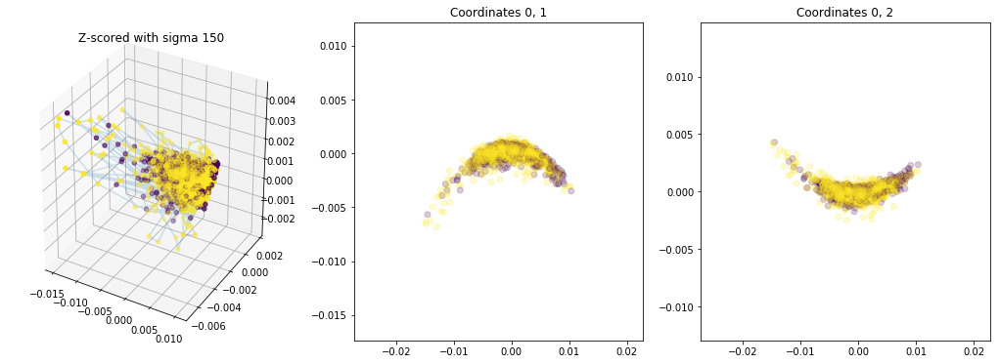

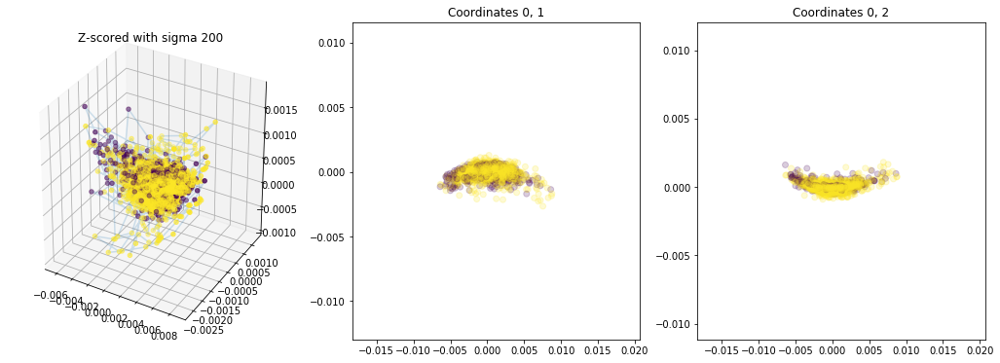

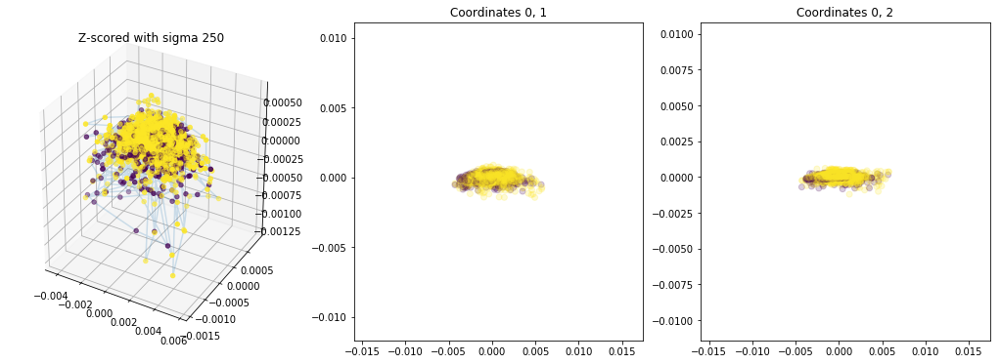

In [7]:
# We see no significant differences. 
# We'll z-score to avoid 'irrelevant' voxels (e.g. always strongly activated) from having too much of an effect
# Now we'll test different sigmas
pid = 0
for i in range(2, 6):
    dat = zscore(movie_data)[pid].T
    [dif_map, dif_vals] = diffmap(dat, i * 75, 1, 4)

    fig = plt.figure(figsize= [18, 6])

    recalled = get_recall_labels(pid, 0)

    ax = fig.add_subplot(1, 3, 1, projection='3d', )
    ax.plot(dif_map[:, 0], dif_map[:, 1], dif_map[:, 2], alpha = 0.2)
    ax.scatter(dif_map[:, 0], dif_map[:, 1], dif_map[:, 2], c = recalled)
    ax.set_title("Z-scored with sigma " + str(i * 50))

    ax = fig.add_subplot(1, 3, 2)
    ax.scatter(dif_map[:, 0], dif_map[:, 1], c = recalled, alpha = 0.2)
    ax.set_title("Coordinates 0, 1")

    ax = fig.add_subplot(1, 3, 3)
    ax.scatter(dif_map[:, 0], dif_map[:, 2], c = recalled, alpha = 0.2)
    ax.set_title("Coordinates 0, 2")
    
# 200 seems like a good number

In [5]:
# We can also use the SRM model (refer to Chen 2015) to reduce the feature space into a "shared space" 
# that all the participants use. This allows for functional alignment of participant brain data while 
# performing dimensionality reduction (it keeps the "shared signal" and discards the "noise")
# Importantly, 
# This can make processing significantly faster as we reduce from 26k voxels to nfeatures (50 here)
srm = brainiak.funcalign.srm.SRM(n_iter = 10, features = 50)
srm.fit(zscore(movie_data))
shared_data = srm.transform(movie_data)

/gpfs/milgram/apps/hpc.rhel7/software/Python/Anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:138: RuntimeWarning: invalid value encountered in sqrt
  ret = um.sqrt(ret, out=ret)
/gpfs/milgram/apps/hpc.rhel7/software/Python/Anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:2251: RuntimeWarning: divide by zero encountered in true_divide
  np.expand_dims(sstd, axis=axis))
/gpfs/milgram/apps/hpc.rhel7/software/Python/Anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:2251: RuntimeWarning: invalid value encountered in true_divide
  np.expand_dims(sstd, axis=axis))


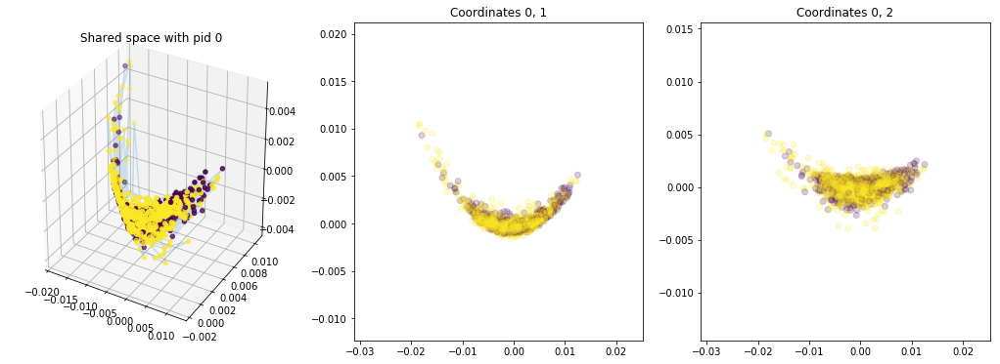

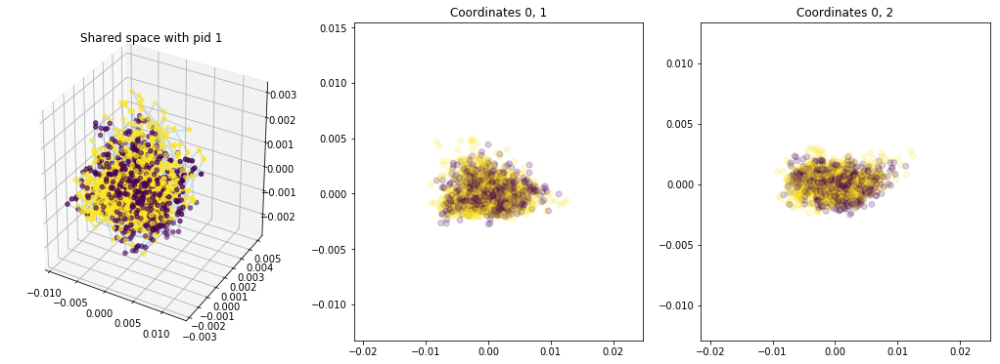

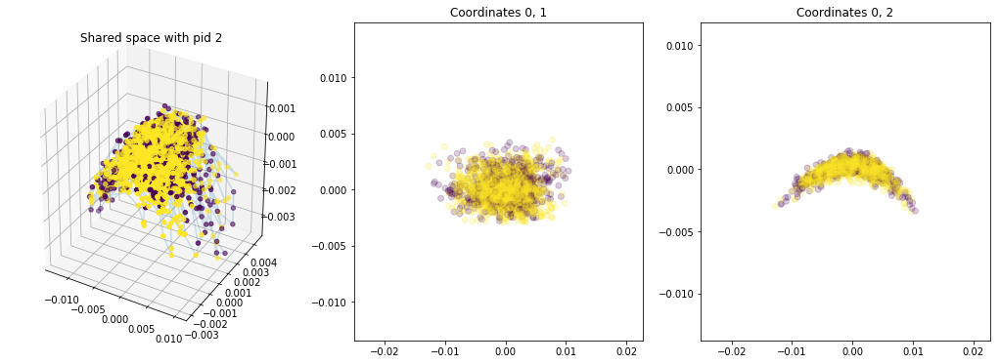

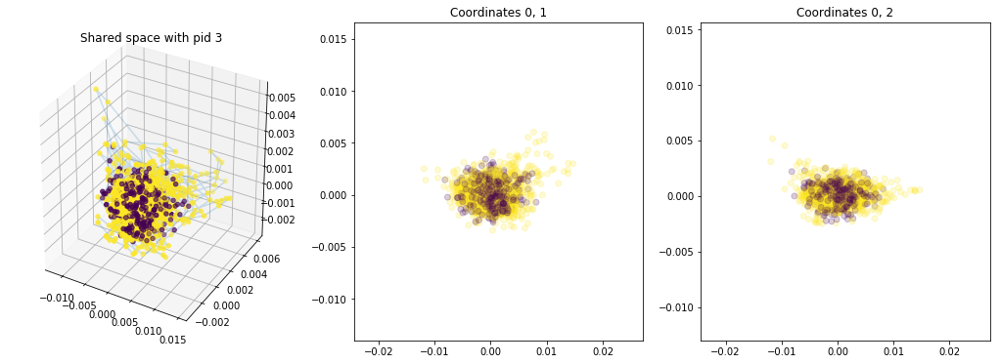

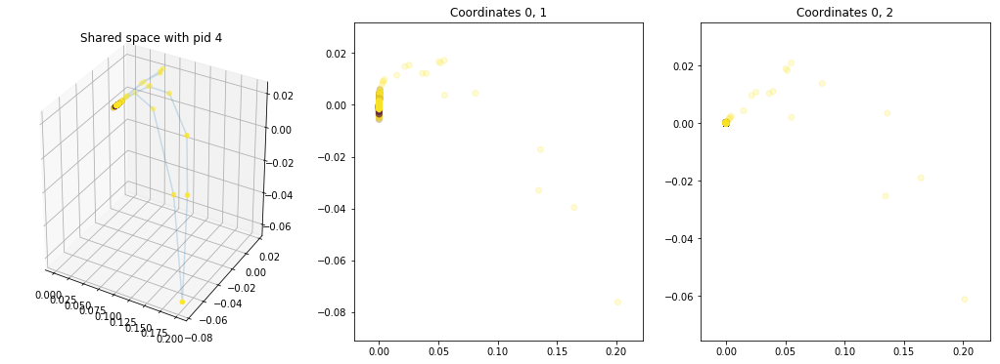

...

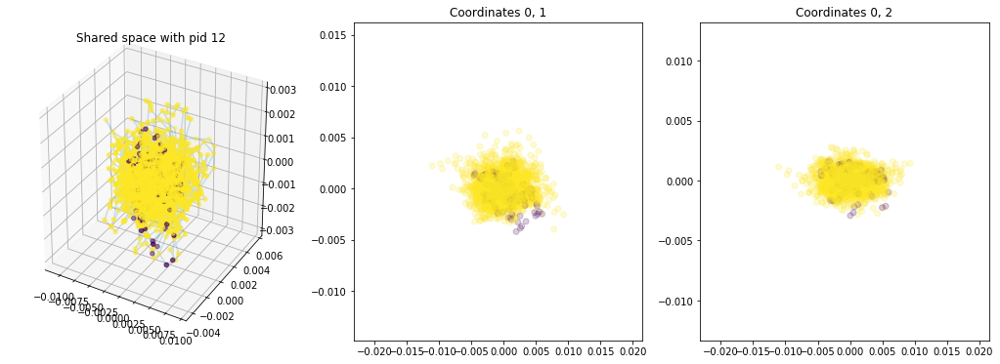

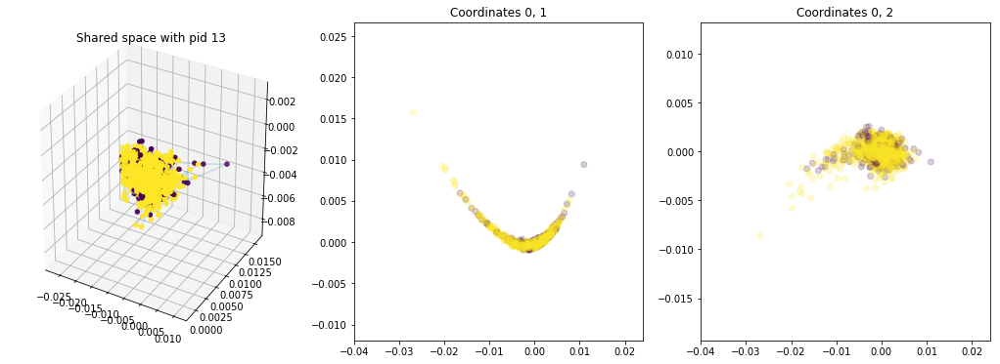

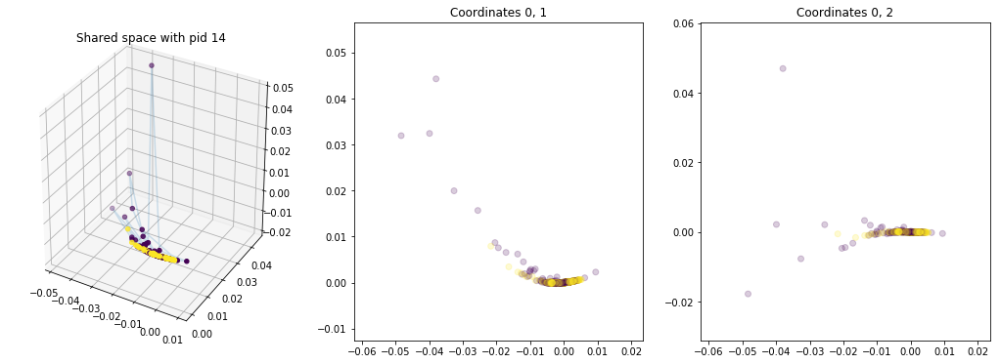

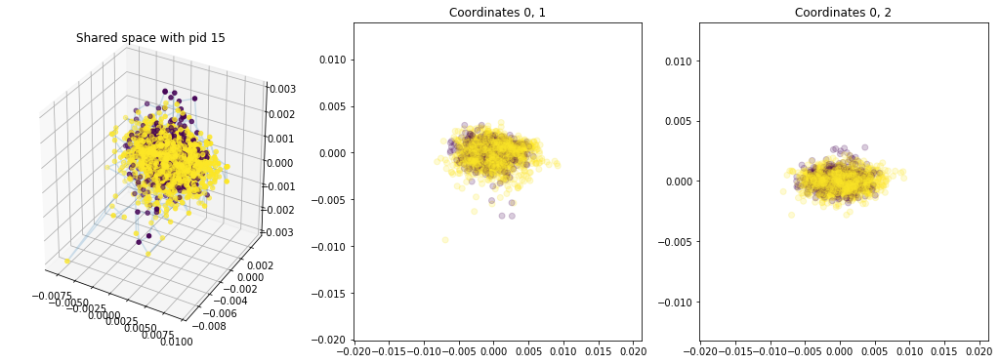

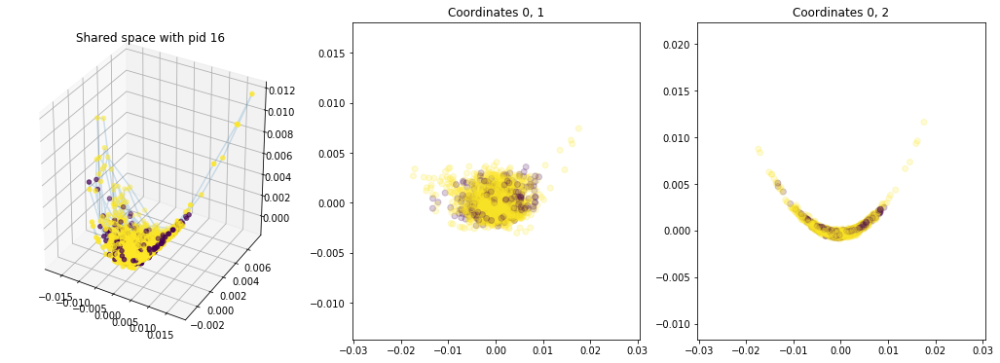

In [9]:
# Using the data in shared space now
for pid in range(n):
    dat = shared_data[pid].T
    [dif_map, dif_vals] = diffmap(dat, 200, 1, 4)

    fig = plt.figure(figsize= [18, 6])

    recalled = get_recall_labels(pid, 0)

    ax = fig.add_subplot(1, 3, 1, projection='3d', )
    ax.plot(dif_map[:, 0], dif_map[:, 1], dif_map[:, 2], alpha = 0.2)
    ax.scatter(dif_map[:, 0], dif_map[:, 1], dif_map[:, 2], c = recalled)
    ax.set_title("Shared space with pid " + str(pid))

    ax = fig.add_subplot(1, 3, 2)
    ax.scatter(dif_map[:, 0], dif_map[:, 1], c = recalled, alpha = 0.2)
    ax.set_title("Coordinates 0, 1")

    ax = fig.add_subplot(1, 3, 3)
    ax.scatter(dif_map[:, 0], dif_map[:, 2], c = recalled, alpha = 0.2)
    ax.set_title("Coordinates 0, 2")

In [6]:
# Looking at the participant data, it seems that different values of sigma may be ideal for each participant
med_dists = []
for pid in range(n): # for participants, print out the median distance 
    xs = shared_data[pid].T
    dists = squareform(pdist(xs))
    med_dists.append(np.median(dists))
    print(str(pid) + ": " + str(np.median(dists)))

0: 176.11759653051098
1: 177.78261290397882
2: 180.00691022554105
3: 179.93027417176216
4: 165.67670913914444
5: 169.44846796322057
6: 173.3516111684939
7: 181.603355037823
8: 177.00386241751784
9: 180.88378633393955
10: 180.18860547672315
11: 178.61086868783423
12: 178.89691948278835
13: 172.7488861427182
14: 163.01664579548947
15: 176.92102993305875
16: 176.3154624611916


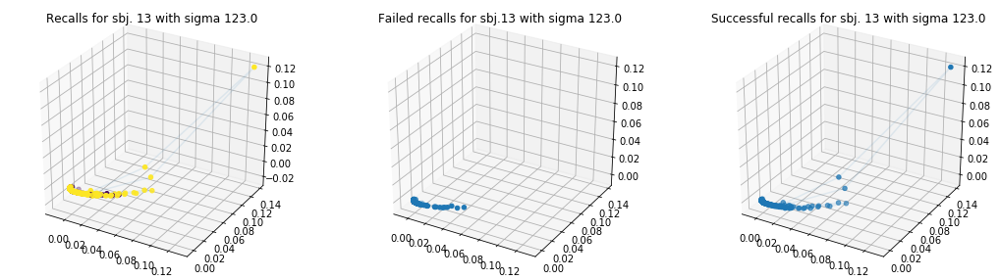

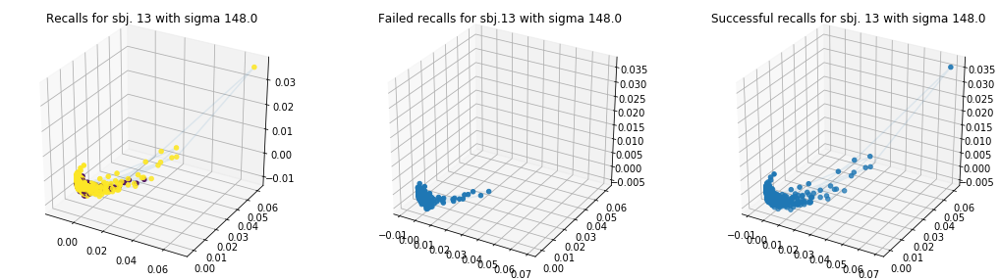

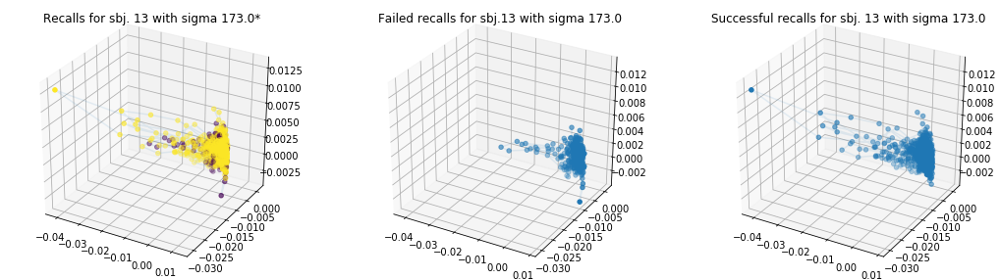

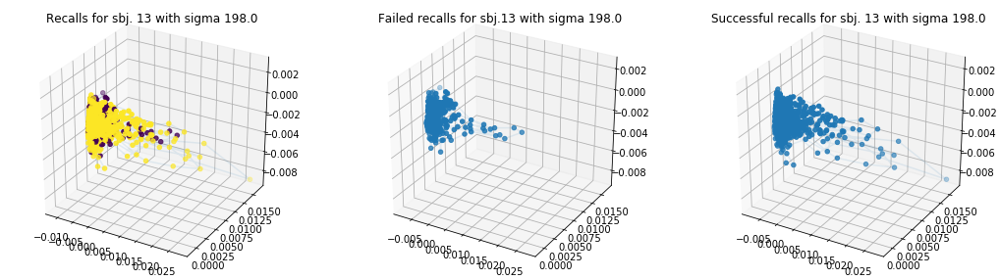

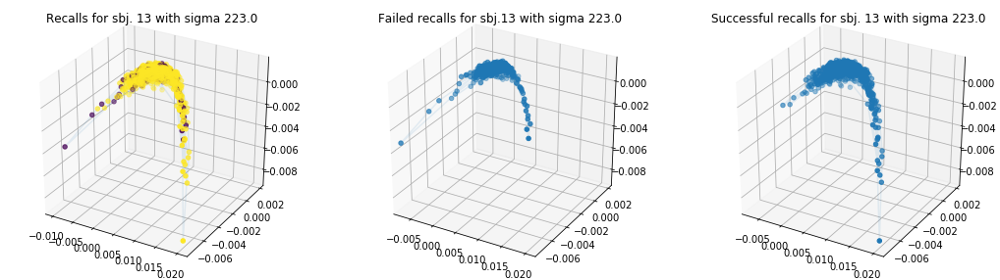

...

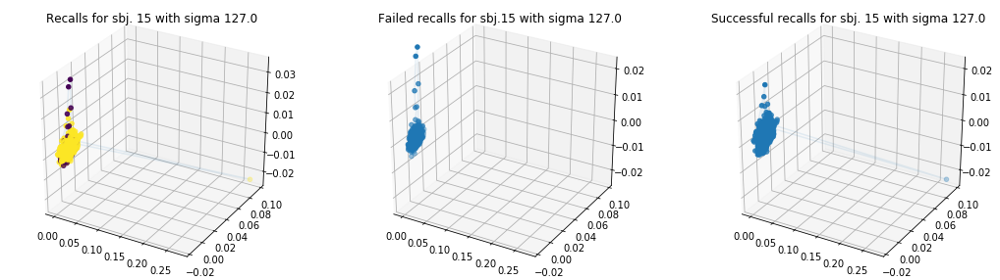

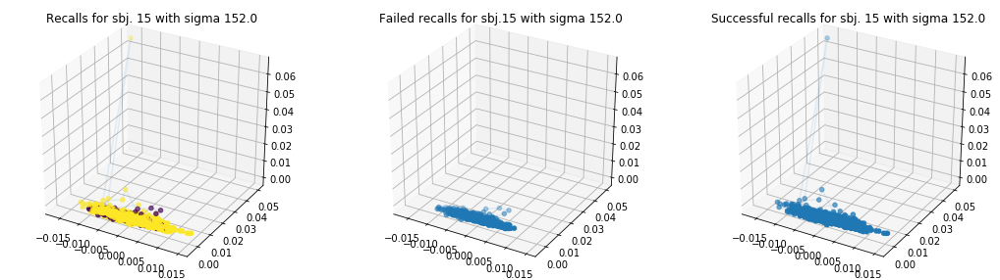

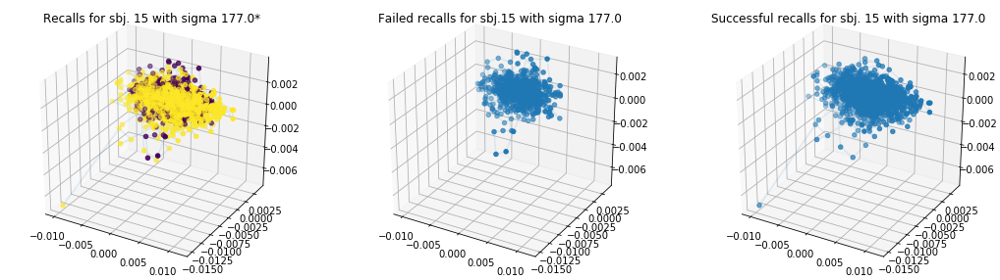

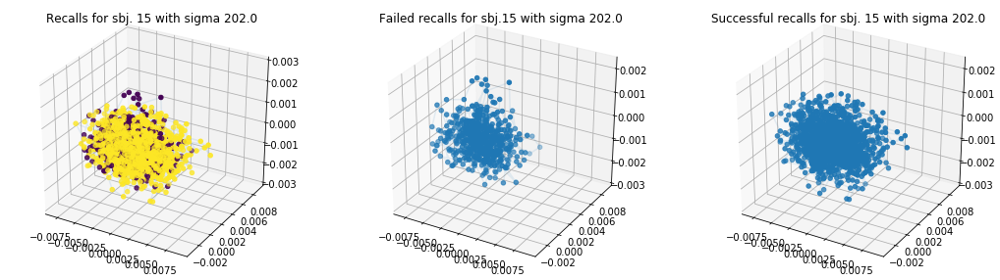

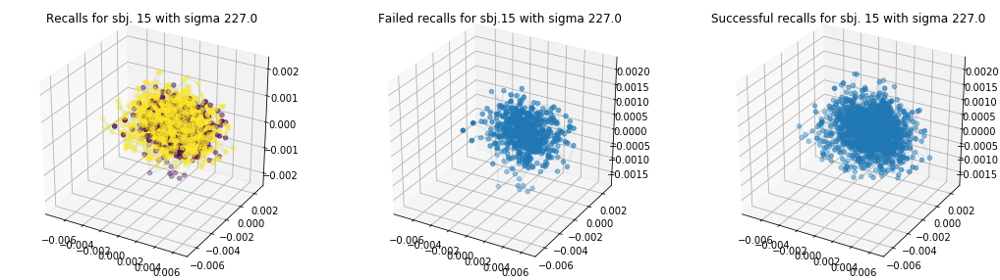

In [11]:
# We can see how sigma near the median distance (which tends to fall a little below the mode) affects our results: 

for pid in np.random.choice(n, 4): # just a few to save time
    dat = shared_data[pid].T
    for i in range(-2, 3):
        sigma = round(med_dists[pid]) + i * 25
        [dif_map, dif_vals] = diffmap(dat, sigma, 1, 4)

        recalled = get_recall_labels(pid, 0)
        successes = [i for i in range(len(recalled)) if recalled[i] == 1]
        failures = [i for i in range(len(recalled)) if recalled[i] == 0]

        fig = plt.figure(figsize= [18, 5])

        ax = fig.add_subplot(1, 3, 1, projection='3d')
        ax.plot(dif_map[:, 0], dif_map[:, 1], dif_map[:, 2], alpha = 0.1)
        ax.scatter(dif_map[:, 0], dif_map[:, 1], dif_map[:, 2], c = recalled)
        ax.set_title("Recalls for sbj. " + str(pid) + " with sigma " + str(sigma) + ("*" * (1 * (i == 0))))

        ax2 = fig.add_subplot(1, 3, 2, projection='3d')
        ax2.plot(dif_map[failures, 0], dif_map[failures, 1], dif_map[failures, 2], alpha = 0.1)
        ax2.scatter(dif_map[failures, 0], dif_map[failures, 1], dif_map[failures, 2])
        ax2.set_title("Failed recalls for sbj." + str(pid) + " with sigma " + str(sigma))

        ax1 = fig.add_subplot(1, 3, 3, projection='3d', sharex = ax2, sharey = ax2, sharez = ax2)
        ax1.plot(dif_map[successes, 0], dif_map[successes, 1], dif_map[successes, 2], alpha = 0.1)
        ax1.scatter(dif_map[successes, 0], dif_map[successes, 1], dif_map[successes, 2])
        ax1.set_title("Successful recalls for sbj. " + str(pid) + " with sigma " + str(sigma))


In [7]:
# Let's look at the recalled TRs/Scenes per participant:
# Some of the data may appear better separated above, but it may actually just 
# due to an imbalance of classes 
recalled_sc = [np.sum(recall_dfs[i, :, 0]) for i in range(n)] 
print("Mean number of scenes recalled (out of 50): " + str(np.mean(recalled_sc)))
for pid in range(n):
    recalled = get_recall_labels(pid, 0)
    print(pid, recalled_sc[pid], np.sum(recalled), str(np.round(np.sum(recalled)/len(recalled), 3)) + "%")

Mean number of scenes recalled (out of 50): 34.64705882352941
0 27.0 1235.0 0.625%
1 25.0 1166.0 0.59%
2 33.0 1336.0 0.676%
3 33.0 1548.0 0.783%
4 33.0 1426.0 0.722%
5 39.0 1736.0 0.879%
6 30.0 1232.0 0.623%
7 38.0 1442.0 0.73%
8 28.0 1227.0 0.621%
9 40.0 1724.0 0.872%
10 34.0 1424.0 0.721%
11 39.0 1602.0 0.811%
12 48.0 1878.0 0.95%
13 38.0 1520.0 0.769%
14 27.0 1227.0 0.621%
15 38.0 1364.0 0.69%
16 39.0 1521.0 0.77%


In [8]:
# Now we'll look at participants' brain data downsampled such that for each voxel we have observations across
# number of SCENES, not TRs, recalled - this is the original information given about participant recalls
# which may be more accurate, though less precise in terms of time
# so we want to check that we see the same patterns:
scene_dat = [scene_voxelavg(shared_data[i], 0) for i in range(n)]

# again, different values of sigma may be ideal
med_dists_sc = []
for pid in range(n): # for a few participants
    xs = scene_dat[pid].T
    dists = squareform(pdist(xs))
    med_dists_sc.append(np.median(dists))

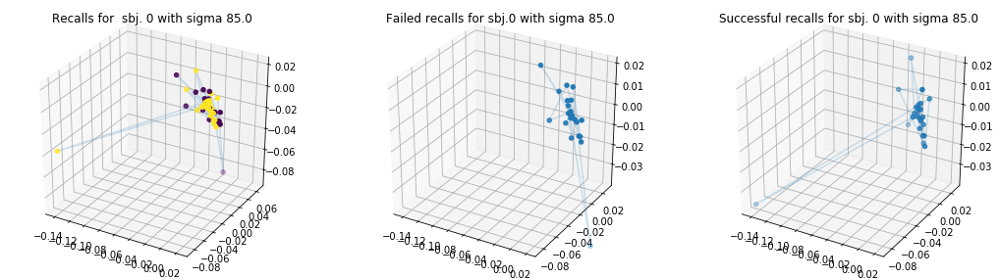

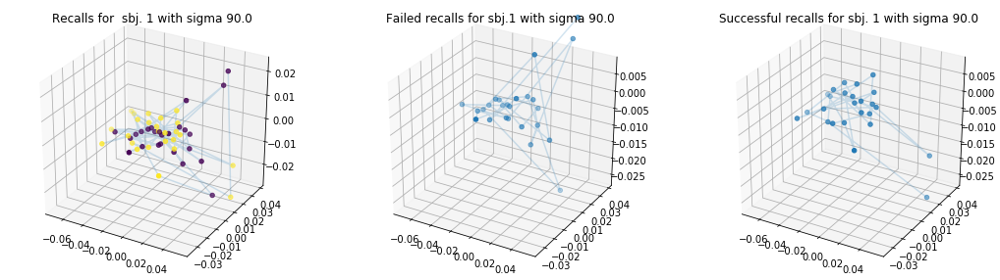

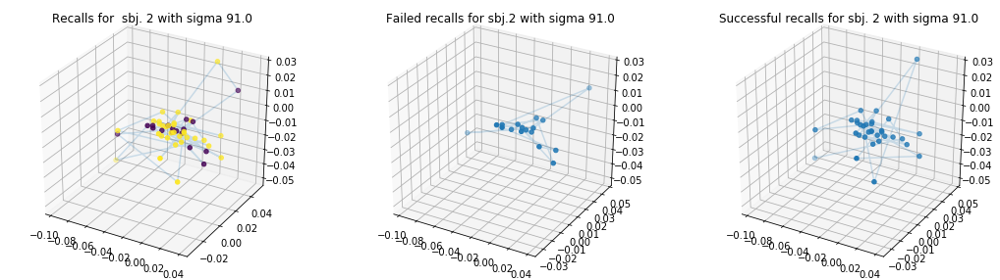

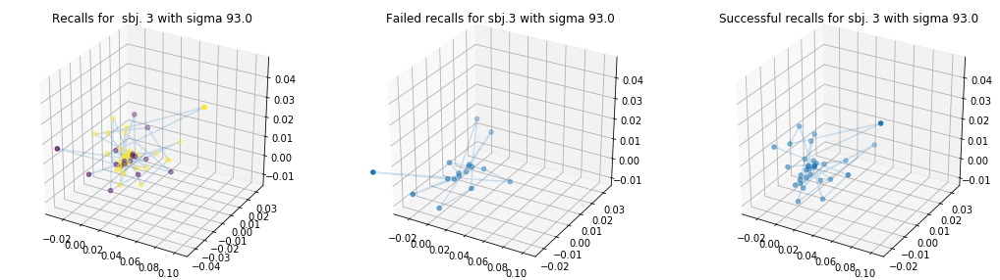

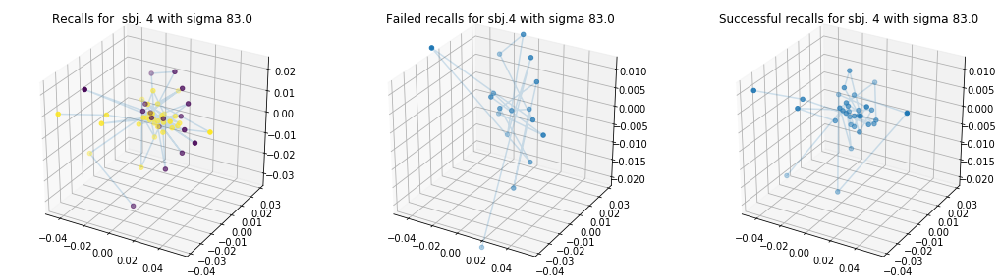

...

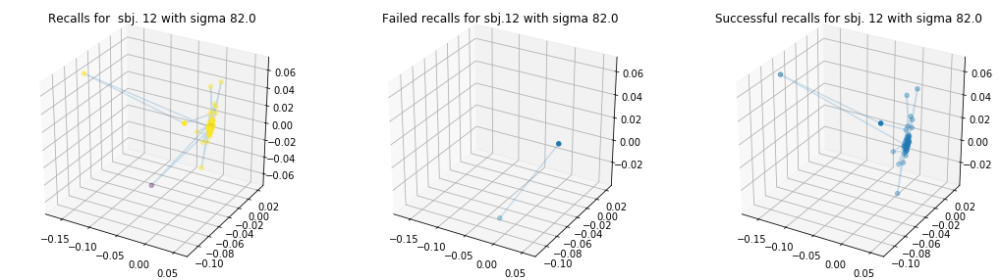

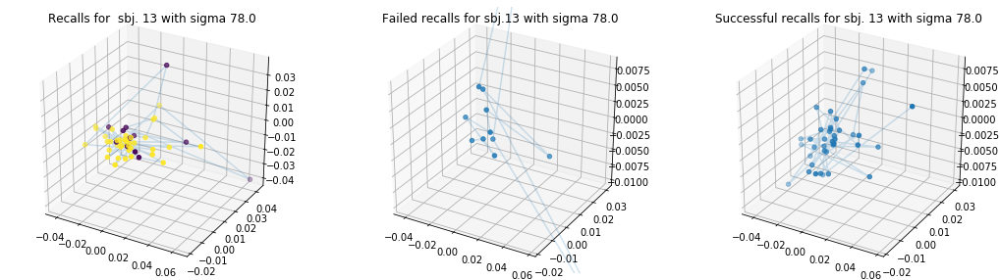

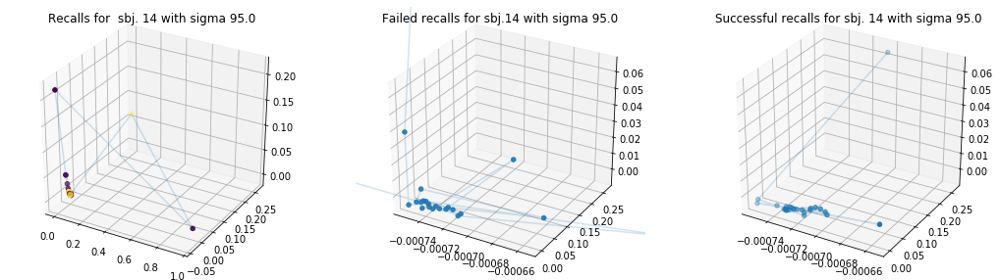

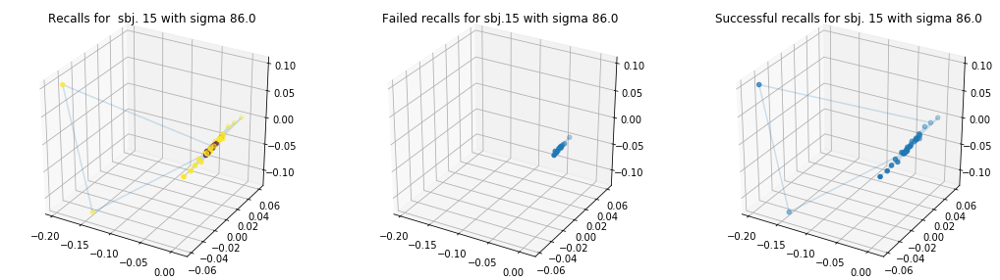

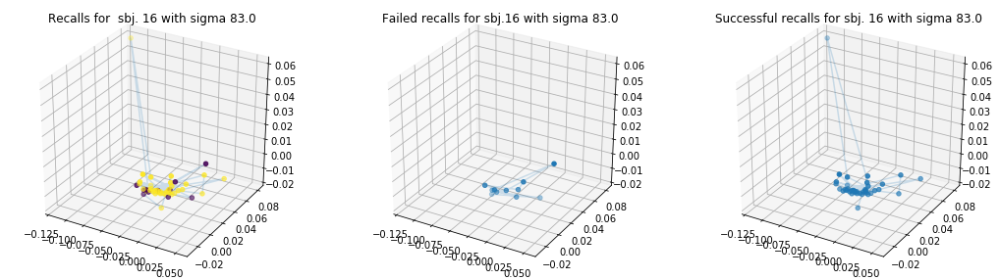

In [14]:
# Again, plotting out recalls in shared space, for each scene
for pid in range(n):
    dat = scene_dat[pid].T
    sigma = round(med_dists_sc[pid])
    [dif_map, dif_vals] = diffmap(dat, sigma, 1, 4)

    recalled = recall_dfs[pid, :, 0]
    successes = [i for i in range(len(recalled)) if recalled[i] == 1]
    failures = [i for i in range(len(recalled)) if recalled[i] == 0]

    fig = plt.figure(figsize= [18, 5])
    
    ax = fig.add_subplot(1, 3, 1, projection='3d')
    ax.plot(dif_map[:, 0], dif_map[:, 1], dif_map[:, 2], alpha = 0.2)
    ax.scatter(dif_map[:, 0], dif_map[:, 1], dif_map[:, 2], c = recalled)
    #ax.scatter(dif_map[:, 0], dif_map[:, 1], dif_map[:, 2], c = np.round(recall_dfs[pid, :, 1]))
    ax.set_title("Recalls for  sbj. " + str(pid) + " with sigma " + str(sigma))
    
    ax2 = fig.add_subplot(1, 3, 2, projection='3d')
    ax2.plot(dif_map[failures, 0], dif_map[failures, 1], dif_map[failures, 2], alpha = 0.2)
    ax2.scatter(dif_map[failures, 0], dif_map[failures, 1], dif_map[failures, 2])
    ax2.set_title("Failed recalls for sbj." + str(pid) + " with sigma " + str(sigma))

    ax1 = fig.add_subplot(1, 3, 3, projection='3d', sharex = ax2, sharey = ax2, sharez = ax2)
    ax1.plot(dif_map[successes, 0], dif_map[successes, 1], dif_map[successes, 2], alpha = 0.2)
    ax1.scatter(dif_map[successes, 0], dif_map[successes, 1], dif_map[successes, 2])
    ax1.set_title("Successful recalls for sbj. " + str(pid) + " with sigma " + str(sigma))

# indeed, we see similar patterns in which the failed and successful recalls appear in the same space- 
# While it seems like the failed recalls are less spread out in both cases (with original brain data
# and in data mapped to shared space, for both TR and scene-based observations), 
# if we account for the fact that there is a class imbalance and 
# failed recalls are the minority class, it is probably that because there are fewer observations that
# there is not as much variation. 
# thus, it seems unlikely that we'll be able to distinguish between the two classes.

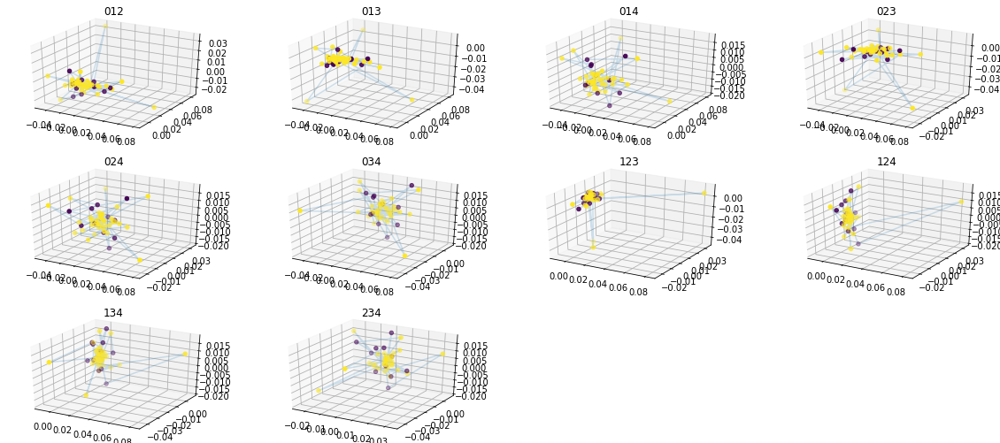

In [15]:
# Let's look at some of the different coordinates...
pid = np.random.choice(n)
coords = 5
dat = scene_dat[pid].T
sigma = round(med_dists_sc[pid])
[dif_map, dif_vals] = diffmap(dat, sigma, 1, coords)

recalled = recall_dfs[pid, :, 0]
successes = [i for i in range(len(recalled)) if recalled[i] == 1]
failures = [i for i in range(len(recalled)) if recalled[i] == 0]

fig = plt.figure(figsize= [20, 12])
pltnum = 1
for i in range(coords - 2):
    for j in range(i + 1, coords - 1):
        for k in range(j + 1, coords):
            ax = fig.add_subplot(4, 4, pltnum, projection='3d')
            ax.plot(dif_map[:, i], dif_map[:, j], dif_map[:, k], alpha = 0.2)
            ax.scatter(dif_map[:, i], dif_map[:, j], dif_map[:, k], c = recalled)
            ax.set_title(str(i) + str(j) + str(k))
            pltnum = pltnum + 1

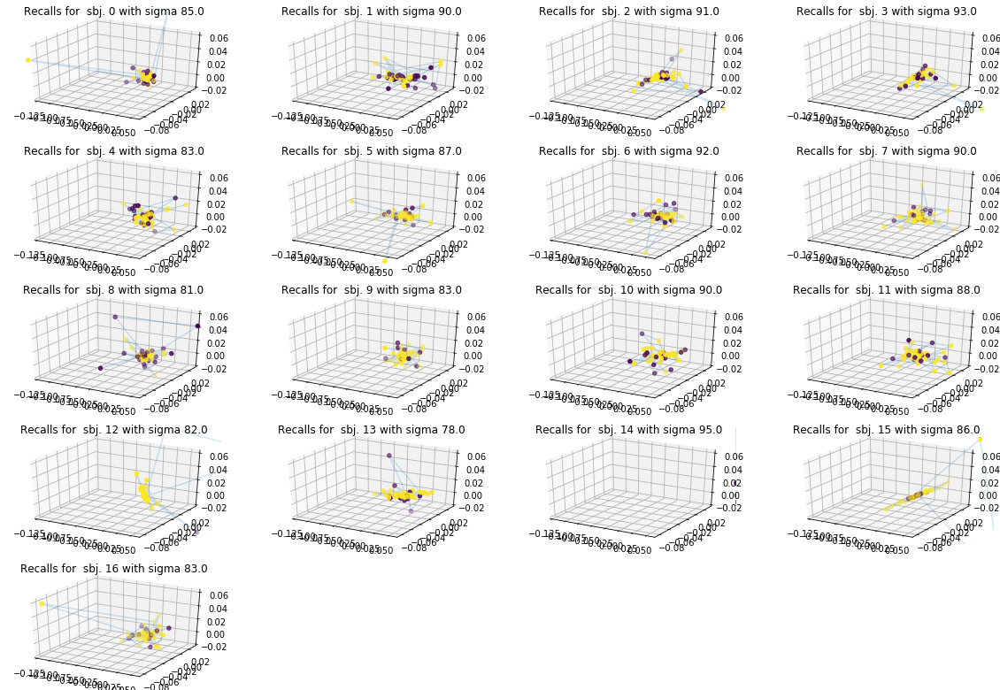

In [16]:
# How do different participants compare?: Shared space, scenes
fig = plt.figure(figsize= [20, 14])
pid = 0
dat = scene_dat[pid].T
sigma = round(med_dists_sc[pid])
[dif_map, dif_vals] = diffmap(dat, sigma, 1, 4)

recalled = recall_dfs[pid, :, 0]
ax0 = fig.add_subplot(5, 4, pid + 1, projection='3d')
ax0.plot(dif_map[:, 0], dif_map[:, 1], dif_map[:, 2], alpha = 0.2)
ax0.scatter(dif_map[:, 0], dif_map[:, 1], dif_map[:, 2], c = recalled)
ax0.set_title("Recalls for  sbj. " + str(pid) + " with sigma " + str(sigma))
for pid in range(1, n):
    dat = scene_dat[pid].T
    sigma = round(med_dists_sc[pid])
    [dif_map, dif_vals] = diffmap(dat, sigma, 1, 4)

    recalled = recall_dfs[pid, :, 0]
    successes = [i for i in range(len(recalled)) if recalled[i] == 1]
    failures = [i for i in range(len(recalled)) if recalled[i] == 0]
    
    ax = fig.add_subplot(5, 4, pid + 1, projection='3d', sharex = ax0, sharey = ax0, sharez = ax0)
    ax.plot(dif_map[:, 0], dif_map[:, 1], dif_map[:, 2], alpha = 0.2)
    ax.scatter(dif_map[:, 0], dif_map[:, 1], dif_map[:, 2], c = recalled)
    ax.set_title("Recalls for  sbj. " + str(pid) + " with sigma " + str(sigma))

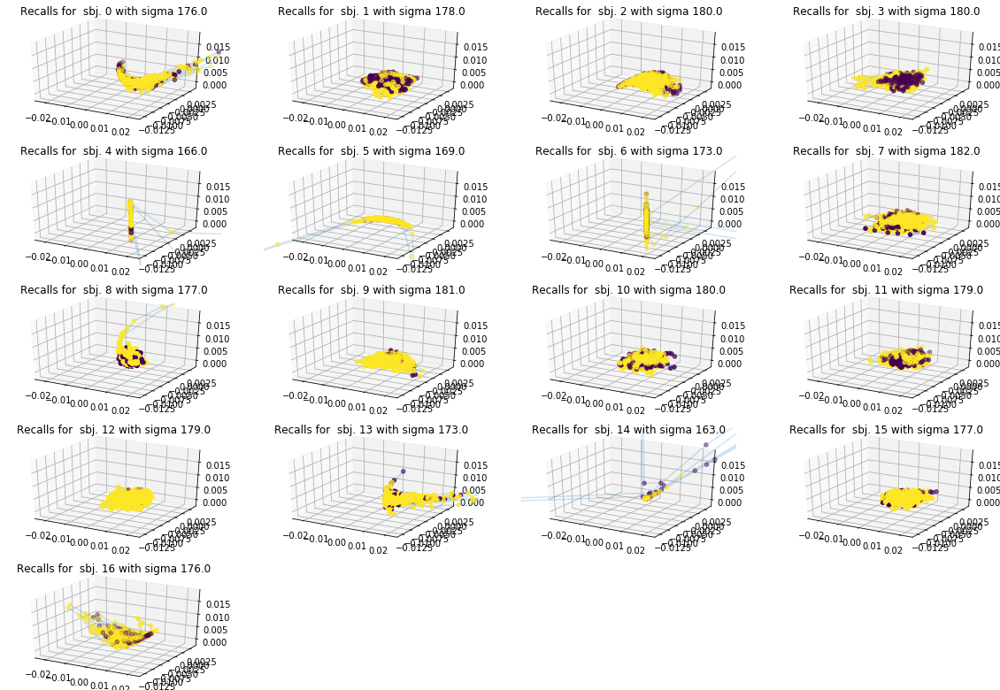

In [17]:
# Compared to using shared space and TRs
fig = plt.figure(figsize= [20, 14])
pid = 0
dat = shared_data[pid].T
sigma = round(med_dists[pid])
[dif_map, dif_vals] = diffmap(dat, sigma, 1, 4)

recalled = get_recall_labels(pid, 0)
ax0 = fig.add_subplot(5, 4, pid + 1, projection='3d')
ax0.plot(dif_map[:, 0], dif_map[:, 1], dif_map[:, 2], alpha = 0.2)
ax0.scatter(dif_map[:, 0], dif_map[:, 1], dif_map[:, 2], c = recalled)
ax0.set_title("Recalls for  sbj. " + str(pid) + " with sigma " + str(sigma))
for pid in range(1, n):
    dat = shared_data[pid].T
    sigma = round(med_dists[pid])
    [dif_map, dif_vals] = diffmap(dat, sigma, 1, 4)

    recalled = get_recall_labels(pid, 0)
    successes = [i for i in range(len(recalled)) if recalled[i] == 1]
    failures = [i for i in range(len(recalled)) if recalled[i] == 0]
    
    ax = fig.add_subplot(5, 4, pid + 1, projection='3d', sharex = ax0, sharey = ax0, sharez = ax0)
    ax.plot(dif_map[:, 0], dif_map[:, 1], dif_map[:, 2], alpha = 0.2)
    ax.scatter(dif_map[:, 0], dif_map[:, 1], dif_map[:, 2], c = recalled)
    ax.set_title("Recalls for  sbj. " + str(pid) + " with sigma " + str(sigma))

/gpfs/milgram/apps/hpc.rhel7/software/Python/Anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:138: RuntimeWarning: invalid value encountered in sqrt
  ret = um.sqrt(ret, out=ret)
/gpfs/milgram/apps/hpc.rhel7/software/Python/Anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:2251: RuntimeWarning: divide by zero encountered in true_divide
  np.expand_dims(sstd, axis=axis))
/gpfs/milgram/apps/hpc.rhel7/software/Python/Anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:2251: RuntimeWarning: invalid value encountered in true_divide
  np.expand_dims(sstd, axis=axis))


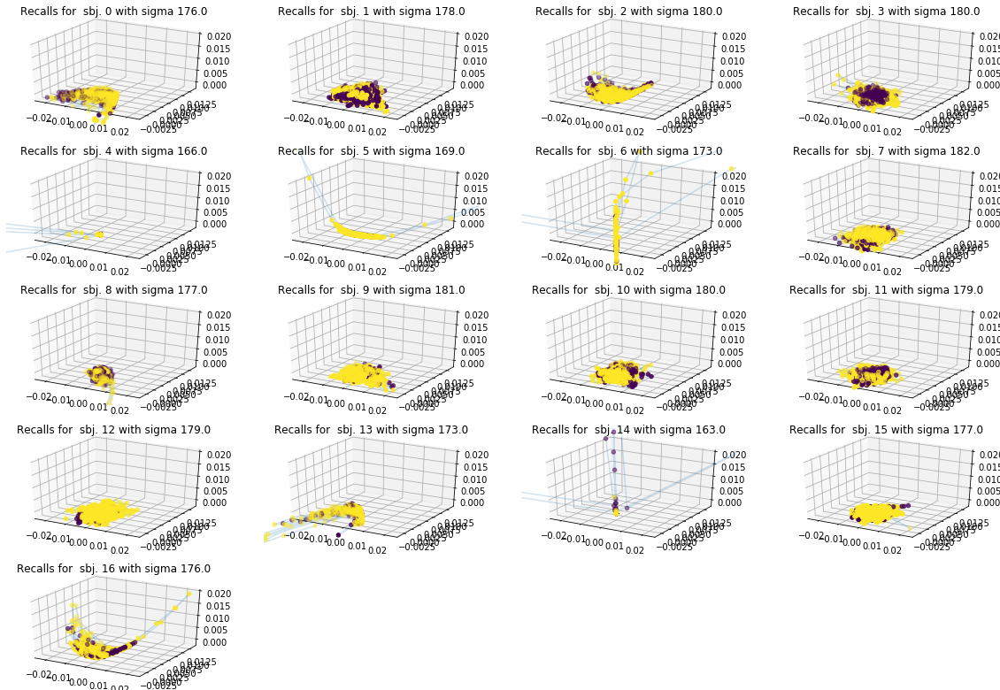

In [23]:
# Before continuing, we can visualize using full movie data (zscored), 
# and again confirm that the same information is represented as a sanity check
fig = plt.figure(figsize= [20, 14])
pid = 0
dat = zscore(movie_data)[pid].T
sigma = round(med_dists[pid])
[dif_map, dif_vals] = diffmap(dat, sigma, 1, 4)

recalled = get_recall_labels(pid, 0)
ax0 = fig.add_subplot(5, 4, pid + 1, projection='3d')
ax0.plot(dif_map[:, 0], dif_map[:, 1], dif_map[:, 2], alpha = 0.2)
ax0.scatter(dif_map[:, 0], dif_map[:, 1], dif_map[:, 2], c = recalled)
ax0.set_title("Recalls for  sbj. " + str(pid) + " with sigma " + str(sigma))
for pid in range(1, n):
    dat = zscore(movie_data)[pid].T
    sigma = round(med_dists[pid])
    [dif_map, dif_vals] = diffmap(dat, sigma, 1, 4)

    recalled = get_recall_labels(pid, 0)
    successes = [i for i in range(len(recalled)) if recalled[i] == 1]
    failures = [i for i in range(len(recalled)) if recalled[i] == 0]
    
    ax = fig.add_subplot(5, 4, pid + 1, projection='3d', sharex = ax0, sharey = ax0, sharez = ax0)
    ax.plot(dif_map[:, 0], dif_map[:, 1], dif_map[:, 2], alpha = 0.2)
    ax.scatter(dif_map[:, 0], dif_map[:, 1], dif_map[:, 2], c = recalled)
    ax.set_title("Recalls for  sbj. " + str(pid) + " with sigma " + str(sigma))
    
# ok, the information is consistent between shared and full voxel space;
# the shared representation seems to capture the important information 

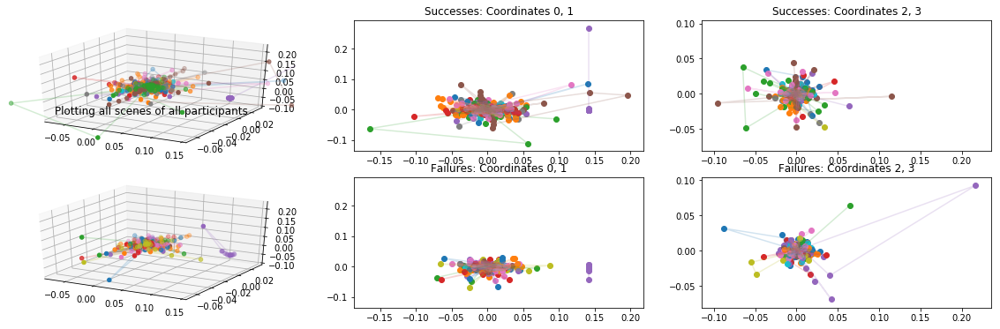

In [24]:
# What if we plot all participants on the same plot?
# shared space, by scene:
fig = plt.figure(figsize= [20, 6])
ax = fig.add_subplot(2, 3, 1, projection='3d')
ax2 = fig.add_subplot(2, 3, 2)
ax3 = fig.add_subplot(2, 3, 3)
ax4 = fig.add_subplot(2, 3, 4, projection='3d', sharex = ax, sharey = ax, sharez = ax)
ax5 = fig.add_subplot(2, 3, 5, sharex = ax2, sharey = ax2)
ax6 = fig.add_subplot(2, 3, 6, sharex = ax3, sharey = ax3)
dif_maps_sc = []
dif_vals_sc = []
for pid in range(n):
    dat = scene_dat[pid].T
    sigma = round(med_dists_sc[pid])
    [dif_map, dif_val] = diffmap(dat, sigma, 1, 20)
    
    dif_maps_sc.append(dif_map)
    dif_vals_sc.append(dif_val)

    recalled = recall_dfs[pid, :, 0]
    successes = [i for i in range(len(recalled)) if recalled[i] == 1]
    failures = [i for i in range(len(recalled)) if recalled[i] == 0]
    
    ax.plot(dif_map[successes, 0], dif_map[successes, 1], dif_map[successes, 2], alpha = 0.2)
    ax.scatter(dif_map[successes, 0], dif_map[successes, 1], dif_map[successes, 2])
    ax.set_title("Plotting all scenes of all participants")
    
    ax2.plot(dif_map[successes, 0], dif_map[successes, 1], alpha = 0.2)
    ax2.scatter(dif_map[successes, 0], dif_map[successes, 1])
    ax2.set_title("Successes: Coordinates 0, 1")
    
    ax3.plot(dif_map[successes, 2], dif_map[successes, 3], alpha = 0.2)
    ax3.scatter(dif_map[successes, 2], dif_map[successes, 3])
    ax3.set_title("Successes: Coordinates 2, 3")
    
    # failures
    ax4.plot(dif_map[failures, 0], dif_map[failures, 1], dif_map[failures, 2], alpha = 0.2)
    ax4.scatter(dif_map[failures, 0], dif_map[failures, 1], dif_map[failures, 2])
    
    ax5.plot(dif_map[failures, 0], dif_map[failures, 1], alpha = 0.2)
    ax5.scatter(dif_map[failures, 0], dif_map[failures, 1])
    ax5.set_title("Failures: Coordinates 0, 1")
    
    ax6.plot(dif_map[failures, 2], dif_map[failures, 3], alpha = 0.2)
    ax6.scatter(dif_map[failures, 2], dif_map[failures, 3])
    ax6.set_title("Failures: Coordinates 2, 3")
    
# It's interesting that though we calculated the diffusion mappings separately, 
# they all map very similarly 

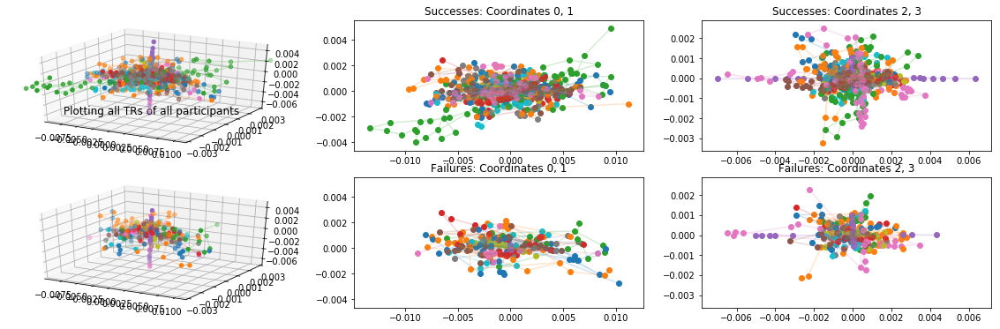

In [18]:
# by TR, but in shared space:
fig = plt.figure(figsize= [20, 6])
ax = fig.add_subplot(2, 3, 1, projection='3d')
ax2 = fig.add_subplot(2, 3, 2)
ax3 = fig.add_subplot(2, 3, 3)
ax4 = fig.add_subplot(2, 3, 4, projection='3d', sharex = ax, sharey = ax, sharez = ax)
ax5 = fig.add_subplot(2, 3, 5, sharex = ax2, sharey = ax2)
ax6 = fig.add_subplot(2, 3, 6, sharex = ax3, sharey = ax3)
dif_maps = []
dif_vals = []
for pid in range(n):
    dat = shared_data[pid].T
    sigma = round(med_dists[pid])
    [dif_map, dif_val] = diffmap(dat, sigma, 1, 20)
    
    dif_maps.append(dif_map)
    dif_vals.append(dif_val)

    recalled = recall_dfs[pid, :, 0]
    successes = [i for i in range(len(recalled)) if recalled[i] == 1]
    failures = [i for i in range(len(recalled)) if recalled[i] == 0]
    
    ax.plot(dif_map[successes, 0], dif_map[successes, 1], dif_map[successes, 2], alpha = 0.2)
    ax.scatter(dif_map[successes, 0], dif_map[successes, 1], dif_map[successes, 2])
    ax.set_title("Plotting all TRs of all participants")
    
    ax2.plot(dif_map[successes, 0], dif_map[successes, 1], alpha = 0.2)
    ax2.scatter(dif_map[successes, 0], dif_map[successes, 1])
    ax2.set_title("Successes: Coordinates 0, 1")
    
    ax3.plot(dif_map[successes, 2], dif_map[successes, 3], alpha = 0.2)
    ax3.scatter(dif_map[successes, 2], dif_map[successes, 3])
    ax3.set_title("Successes: Coordinates 2, 3")
    
    # failures
    ax4.plot(dif_map[failures, 0], dif_map[failures, 1], dif_map[failures, 2], alpha = 0.2)
    ax4.scatter(dif_map[failures, 0], dif_map[failures, 1], dif_map[failures, 2])
    
    ax5.plot(dif_map[failures, 0], dif_map[failures, 1], alpha = 0.2)
    ax5.scatter(dif_map[failures, 0], dif_map[failures, 1])
    ax5.set_title("Failures: Coordinates 0, 1")
    
    ax6.plot(dif_map[failures, 2], dif_map[failures, 3], alpha = 0.2)
    ax6.scatter(dif_map[failures, 2], dif_map[failures, 3])
    ax6.set_title("Failures: Coordinates 2, 3")

In [9]:
# We should also use all of the participants (in shared space) together to learn the diffusion map 
# rather than each one individually, to confirm that the brain data does map very similarly among participants

# transform a list of n (feat x scene) matrices to a single flat (n * scene x feat) matrix to use as input 
sharedscene_flat = scene_dat[0].T 
for pid in range(1, n):
    sharedscene_flat = np.append(sharedscene_flat, scene_dat[pid].T, axis = 0)

In [19]:
dists = pdist(sharedscene_flat)
[dif_map, dif_vals] = diffmap(sharedscene_flat, np.median(dists), 1, 4)

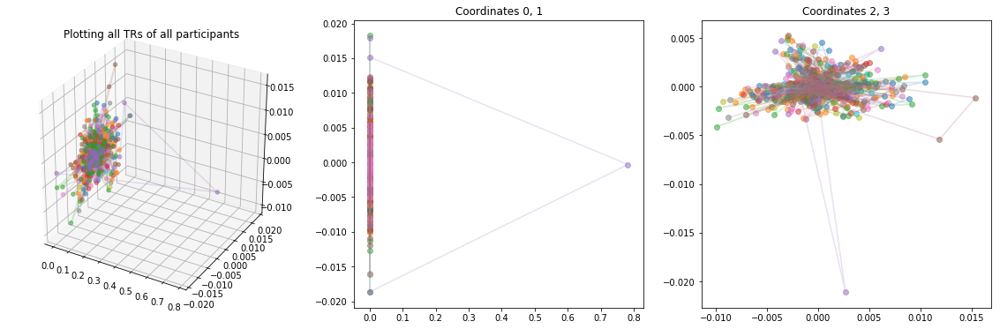

In [21]:
fig = plt.figure(figsize= [20, 6])
ax = fig.add_subplot(1, 3, 1, projection='3d')
ax.set_title("Plotting all TRs of all participants")
ax2 = fig.add_subplot(1, 3, 2)
ax2.set_title("Coordinates 0, 1")
ax3 = fig.add_subplot(1, 3, 3)
ax3.set_title("Coordinates 2, 3")
for pid in range(n):
    idx = range(50 * pid, 50 * (pid + 1))
    ax.plot(dif_map[idx, 0], dif_map[idx, 1], dif_map[idx, 2], alpha = 0.2)
    ax.scatter(dif_map[idx, 0], dif_map[idx, 1], dif_map[idx, 2], alpha = 0.5)
    
    ax2.plot(dif_map[idx, 0], dif_map[idx, 1], alpha = 0.2)
    ax2.scatter(dif_map[idx, 0], dif_map[idx, 1], alpha = 0.5)
    
    ax3.plot(dif_map[idx, 2], dif_map[idx, 3], alpha = 0.2)
    ax3.scatter(dif_map[idx, 2], dif_map[idx, 3],  alpha = 0.5)

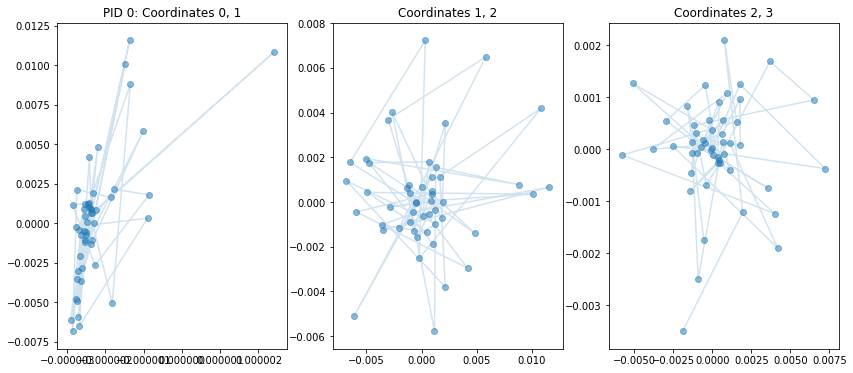

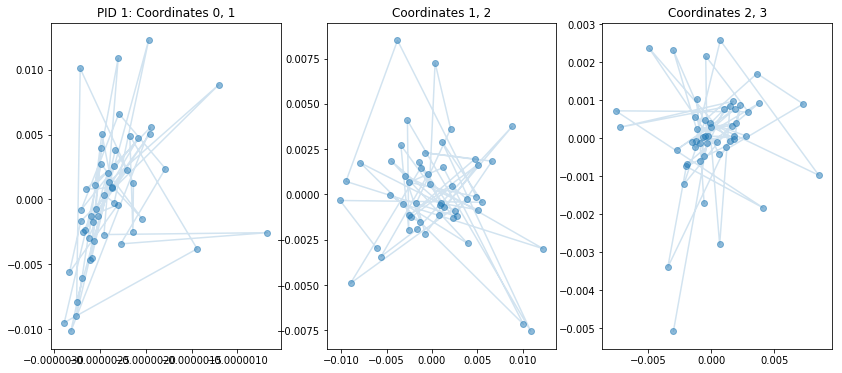

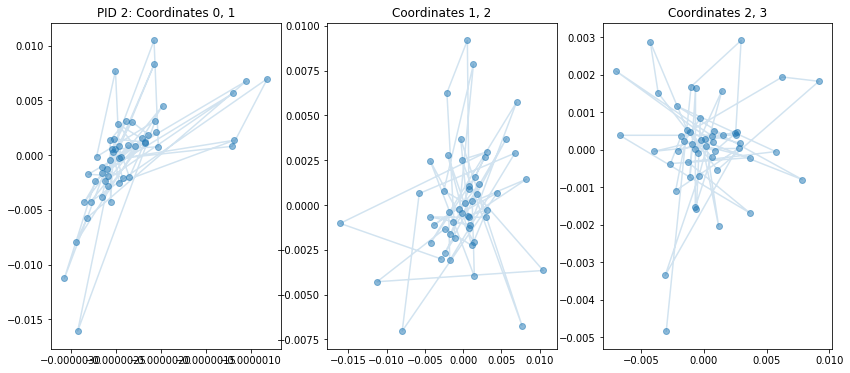

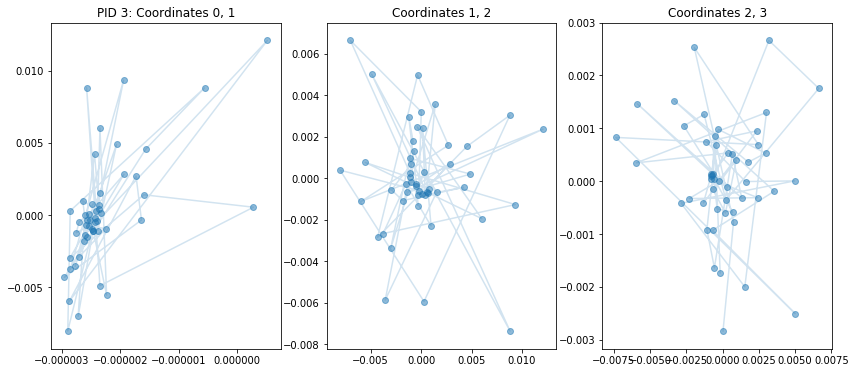

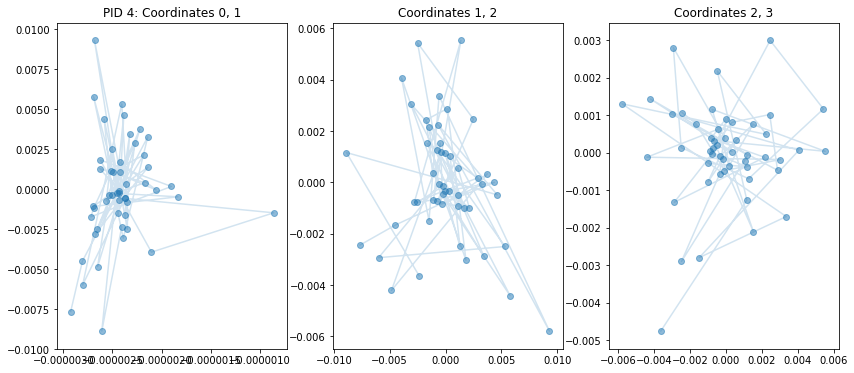

...

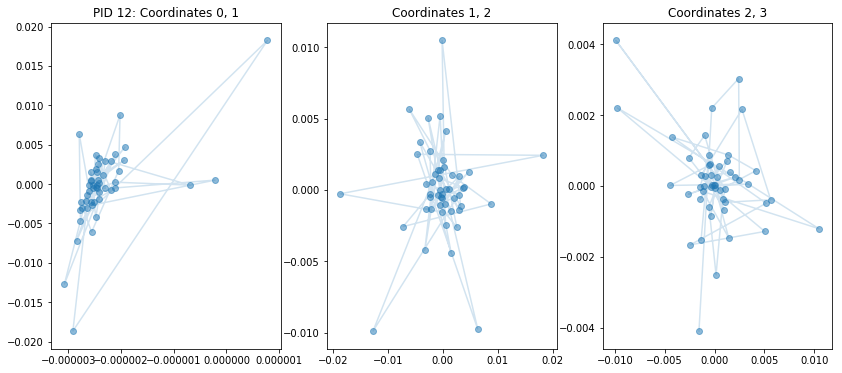

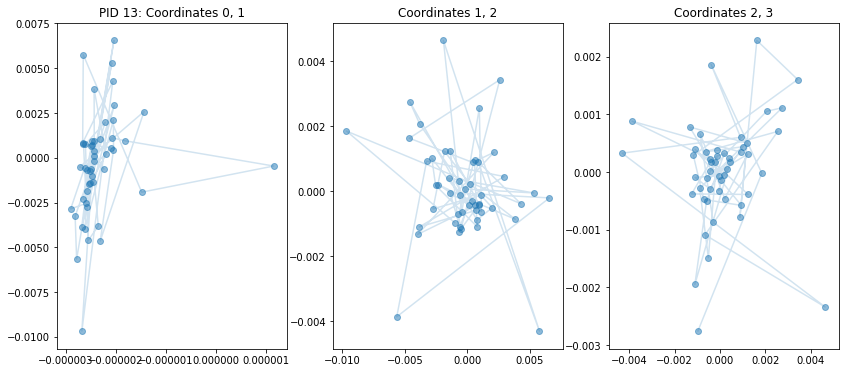

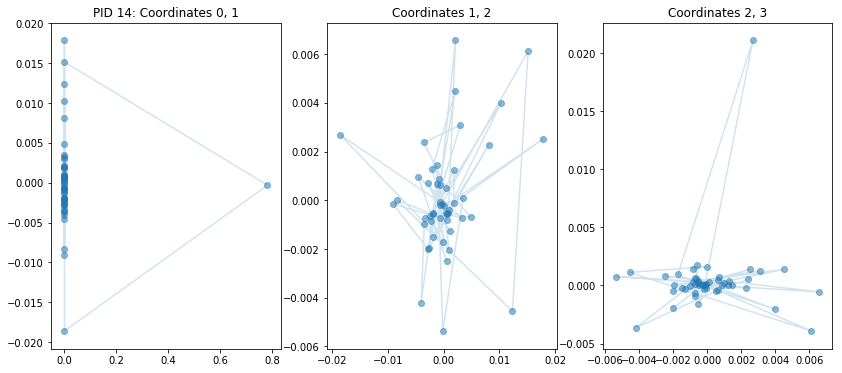

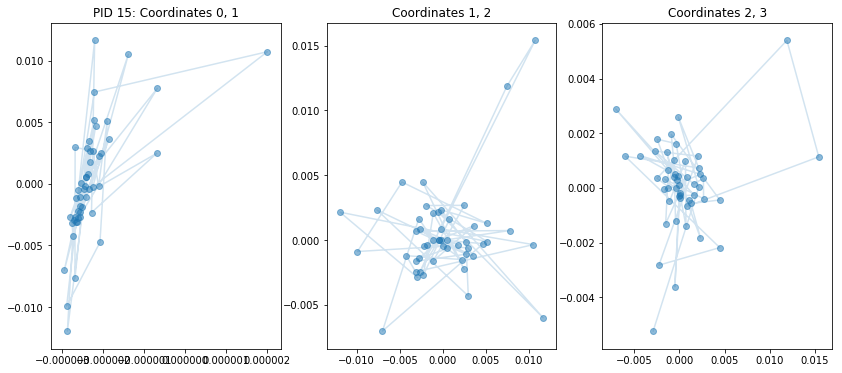

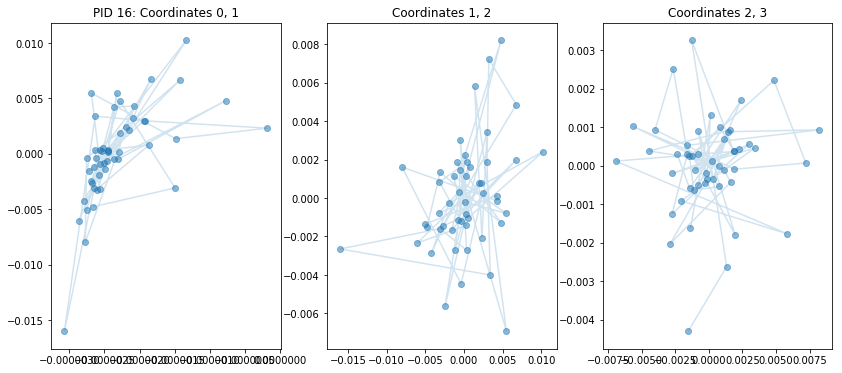

In [29]:
# We can see that there is an inherent pattern in the brain data:
for pid in range(n):
    fig = plt.figure(figsize= [14, 4])
    ax = fig.add_subplot(1, 3, 1)
    ax.set_title("PID %d: Coordinates 0, 1" % pid)
    ax2 = fig.add_subplot(1, 3, 2)
    ax2.set_title("Coordinates 1, 2")
    ax3 = fig.add_subplot(1, 3, 3)
    ax3.set_title("Coordinates 2, 3")
    
    idx = range(50 * pid, 50 * (pid + 1))
    
    ax.plot(dif_map[idx, 0], dif_map[idx, 1], alpha = 0.2)
    ax.scatter(dif_map[idx, 0], dif_map[idx, 1], alpha = 0.5)
    
    ax2.plot(dif_map[idx, 1], dif_map[idx, 2], alpha = 0.2)
    ax2.scatter(dif_map[idx, 1], dif_map[idx, 2], alpha = 0.5)
    
    ax3.plot(dif_map[idx, 2], dif_map[idx, 3], alpha = 0.2)
    ax3.scatter(dif_map[idx, 2], dif_map[idx, 3],  alpha = 0.5)
    
# PID14 (subject 15) seems to be an outlier: lots of exact 0 values in dimension 0

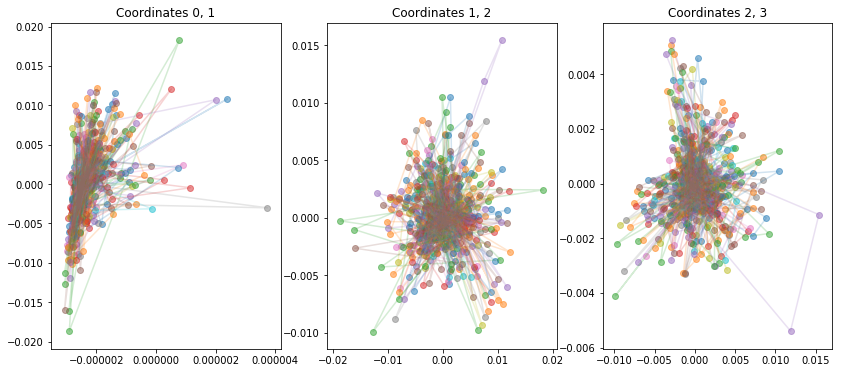

In [22]:
# If we look at them all together:
fig = plt.figure(figsize= [14, 6])
ax = fig.add_subplot(1, 3, 1)
ax.set_title("Coordinates 0, 1")
ax2 = fig.add_subplot(1, 3, 2)
ax2.set_title("Coordinates 1, 2")
ax3 = fig.add_subplot(1, 3, 3)
ax3.set_title("Coordinates 2, 3")
for pid in range(14): #pid 14 is a outlier...
    idx = range(50 * pid, 50 * (pid + 1))
    
    ax.plot(dif_map[idx, 0], dif_map[idx, 1], alpha = 0.2)
    ax.scatter(dif_map[idx, 0], dif_map[idx, 1], alpha = 0.5)
    
    ax2.plot(dif_map[idx, 1], dif_map[idx, 2], alpha = 0.2)
    ax2.scatter(dif_map[idx, 1], dif_map[idx, 2], alpha = 0.5)
    
    ax3.plot(dif_map[idx, 2], dif_map[idx, 3], alpha = 0.2)
    ax3.scatter(dif_map[idx, 2], dif_map[idx, 3],  alpha = 0.5)
for pid in [15, 16]: # pid 14 is a outlier, so we'll exclude it here to better visualize 
    idx = range(50 * pid, 50 * (pid + 1))
    
    ax.plot(dif_map[idx, 0], dif_map[idx, 1], alpha = 0.2)
    ax.scatter(dif_map[idx, 0], dif_map[idx, 1], alpha = 0.5)
    
    ax2.plot(dif_map[idx, 1], dif_map[idx, 2], alpha = 0.2)
    ax2.scatter(dif_map[idx, 1], dif_map[idx, 2], alpha = 0.5)
    
    ax3.plot(dif_map[idx, 2], dif_map[idx, 3], alpha = 0.2)
    ax3.scatter(dif_map[idx, 2], dif_map[idx, 3],  alpha = 0.5)
    

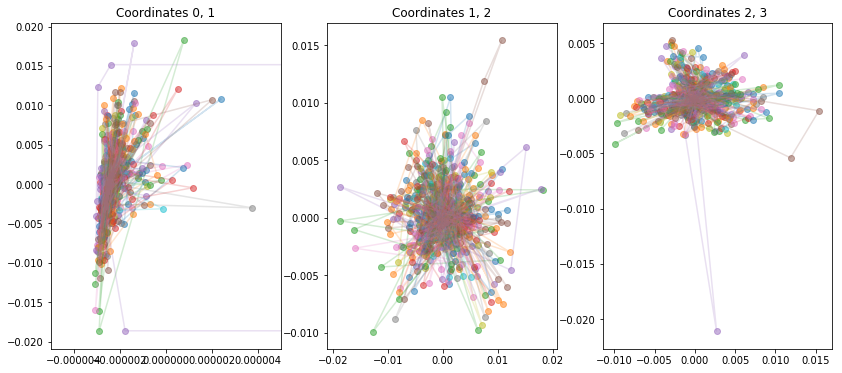

In [29]:
# If we look at them all together, colored by participant
fig = plt.figure(figsize= [14, 6])
ax = fig.add_subplot(1, 3, 1)
ax.set_title("Coordinates 0, 1")
ax.set_xlim([-0.000005, 0.000005])
ax2 = fig.add_subplot(1, 3, 2)
ax2.set_title("Coordinates 1, 2")
ax3 = fig.add_subplot(1, 3, 3)
ax3.set_title("Coordinates 2, 3")
for pid in range(n): 
    idx = range(50 * pid, 50 * (pid + 1))
    
    ax.plot(dif_map[idx, 0], dif_map[idx, 1], alpha = 0.2)
    ax.scatter(dif_map[idx, 0], dif_map[idx, 1], alpha = 0.5)
    
    ax2.plot(dif_map[idx, 1], dif_map[idx, 2], alpha = 0.2)
    ax2.scatter(dif_map[idx, 1], dif_map[idx, 2], alpha = 0.5)
    
    ax3.plot(dif_map[idx, 2], dif_map[idx, 3], alpha = 0.2)
    ax3.scatter(dif_map[idx, 2], dif_map[idx, 3],  alpha = 0.5)

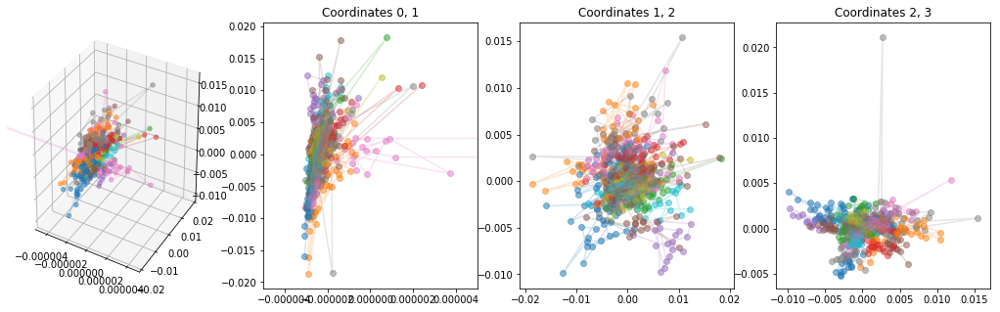

In [20]:
# Colored by scene
fig = plt.figure(figsize= [18, 5])
ax0 = fig.add_subplot(1, 4, 1, projection='3d')
ax0.set_xlim([-0.000005, 0.000005])
ax = fig.add_subplot(1, 4, 2)
ax.set_title("Coordinates 0, 1")
ax.set_xlim([-0.000005, 0.000005])
ax2 = fig.add_subplot(1, 4, 3)
ax2.set_title("Coordinates 1, 2")
ax3 = fig.add_subplot(1, 4, 4)
ax3.set_title("Coordinates 2, 3")
for scene in range(nScenes): 
    idx = [int(x) for x in (np.linspace(0, np.shape(dif_map)[0], n + 1)[:-1]) + scene]
    
    ax0.plot(dif_map[idx, 0], dif_map[idx, 1], dif_map[idx, 2], alpha = 0.2)
    ax0.scatter(dif_map[idx, 0], dif_map[idx, 1], dif_map[idx, 2], alpha = 0.5)
    
    ax.plot(dif_map[idx, 0], dif_map[idx, 1], alpha = 0.2)
    ax.scatter(dif_map[idx, 0], dif_map[idx, 1], alpha = 0.5)
    
    ax2.plot(dif_map[idx, 1], dif_map[idx, 2], alpha = 0.2)
    ax2.scatter(dif_map[idx, 1], dif_map[idx, 2], alpha = 0.5)
    
    ax3.plot(dif_map[idx, 2], dif_map[idx, 3], alpha = 0.2)
    ax3.scatter(dif_map[idx, 2], dif_map[idx, 3],  alpha = 0.5)
    
# We see distinct clusters of scenes! 

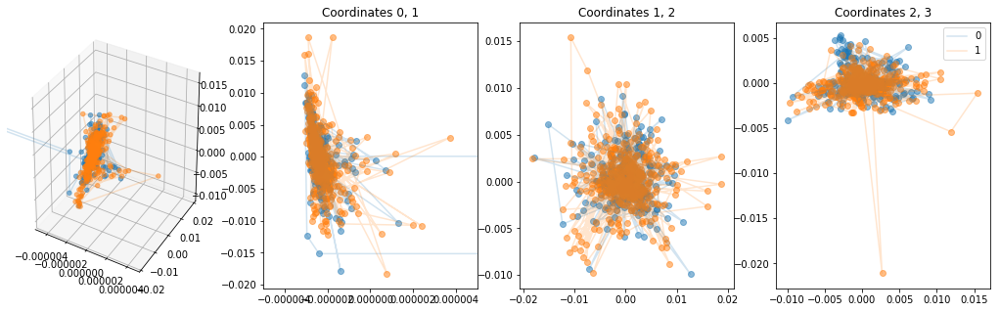

In [14]:
# transform a list of n (feat x scene) matrices to a single flat (n * scene x feat) matrix to use as input 
recall_flat = recall_dfs[0, :, 0]
for pid in range(1, n):
    recall_flat = np.append(recall_flat, recall_dfs[pid, :, 0])
    
# Colored by recall
fig = plt.figure(figsize= [18, 5])
ax0 = fig.add_subplot(1, 4, 1, projection='3d')
ax0.set_xlim([-0.000005, 0.000005])
ax = fig.add_subplot(1, 4, 2)
ax.set_title("Coordinates 0, 1")
ax.set_xlim([-0.000005, 0.000005])
ax2 = fig.add_subplot(1, 4, 3)
ax2.set_title("Coordinates 1, 2")
ax3 = fig.add_subplot(1, 4, 4)
ax3.set_title("Coordinates 2, 3")
for recall in [0, 1]: 
    idx = np.ravel(np.where(recall_flat == recall))
    
    ax0.plot(dif_map[idx, 0], dif_map[idx, 1], dif_map[idx, 2], alpha = 0.2)
    ax0.scatter(dif_map[idx, 0], dif_map[idx, 1], dif_map[idx, 2], alpha = 0.5)
    
    ax.plot(dif_map[idx, 0], dif_map[idx, 1], alpha = 0.2)
    ax.scatter(dif_map[idx, 0], dif_map[idx, 1], alpha = 0.5)
    
    ax2.plot(dif_map[idx, 1], dif_map[idx, 2], alpha = 0.2)
    ax2.scatter(dif_map[idx, 1], dif_map[idx, 2], alpha = 0.5)
    
    ax3.plot(dif_map[idx, 2], dif_map[idx, 3], alpha = 0.2)
    ax3.scatter(dif_map[idx, 2], dif_map[idx, 3],  alpha = 0.5)
ax3.legend([0, 1])
    
# It doesn't look like there exists clear separation, unfortunately

#### It seems like there are not distinct clusters of observations for either subjects or recall vs. non-recall, we do see distinct
#### clusters based on scenes. Can we predict the scene based on the diffusion mapping?

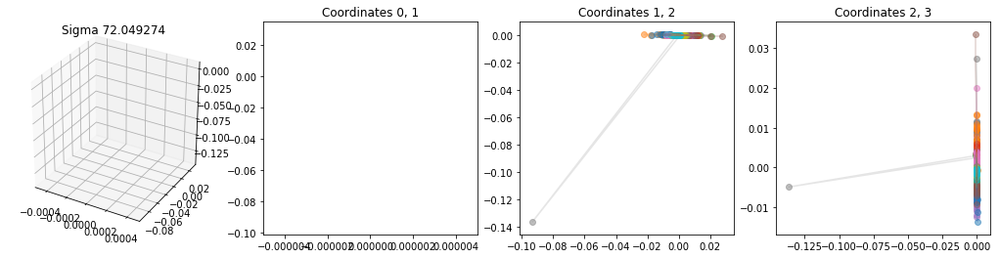

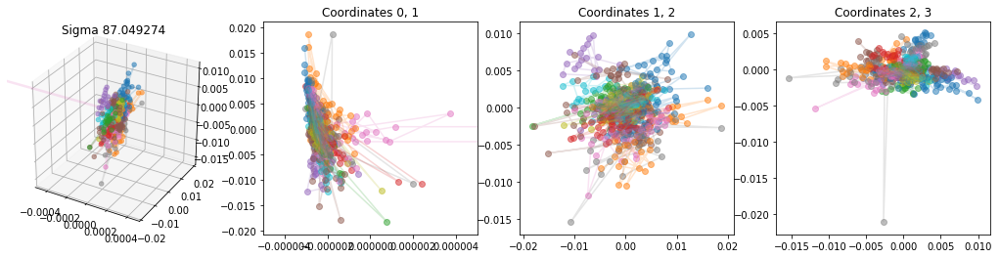

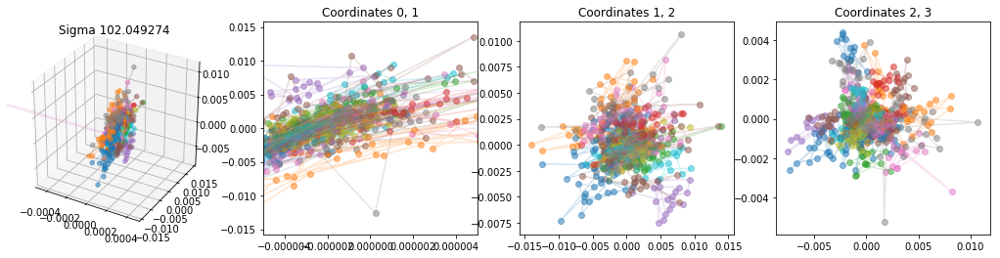

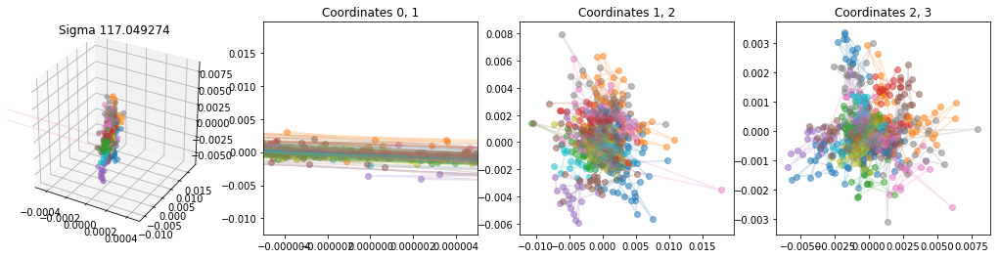

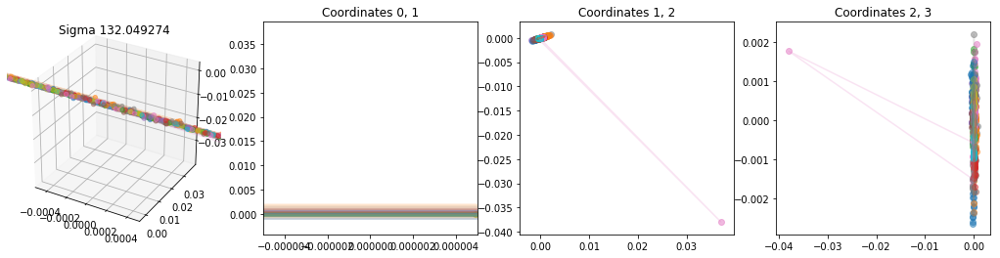

In [33]:
## We'll first try to find an appropriate sigma 
# Colored by scene

for sigdif in range(-1, 4):
    sig = np.median(dists) + 15 * sigdif
    [dif_map, dif_vals] = diffmap(sharedscene_flat, sig, 1, 4)
    
    fig = plt.figure(figsize= [18, 4])
    ax0 = fig.add_subplot(1, 4, 1, projection='3d')
    ax0.set_xlim([-0.0005, 0.0005])
    ax0.set_title("Sigma %f" % sig)
    ax = fig.add_subplot(1, 4, 2)
    ax.set_title("Coordinates 0, 1")
    ax.set_xlim([-0.000005, 0.000005])
    ax2 = fig.add_subplot(1, 4, 3)
    ax2.set_title("Coordinates 1, 2")
    ax3 = fig.add_subplot(1, 4, 4)
    ax3.set_title("Coordinates 2, 3")
    for scene in range(nScenes): 
        idx = [int(x) for x in (np.linspace(0, np.shape(dif_map)[0], n + 1)[:-1]) + scene]

        ax0.plot(dif_map[idx, 0], dif_map[idx, 1], dif_map[idx, 2], alpha = 0.2)
        ax0.scatter(dif_map[idx, 0], dif_map[idx, 1], dif_map[idx, 2], alpha = 0.5)

        ax.plot(dif_map[idx, 0], dif_map[idx, 1], alpha = 0.2 )
        ax.scatter(dif_map[idx, 0], dif_map[idx, 1], alpha = 0.5)

        ax2.plot(dif_map[idx, 1], dif_map[idx, 2], alpha = 0.2)
        ax2.scatter(dif_map[idx, 1], dif_map[idx, 2], alpha = 0.5)

        ax3.plot(dif_map[idx, 2], dif_map[idx, 3], alpha = 0.2)
        ax3.scatter(dif_map[idx, 2], dif_map[idx, 3],  alpha = 0.5)
        
# 100 looks reasonable

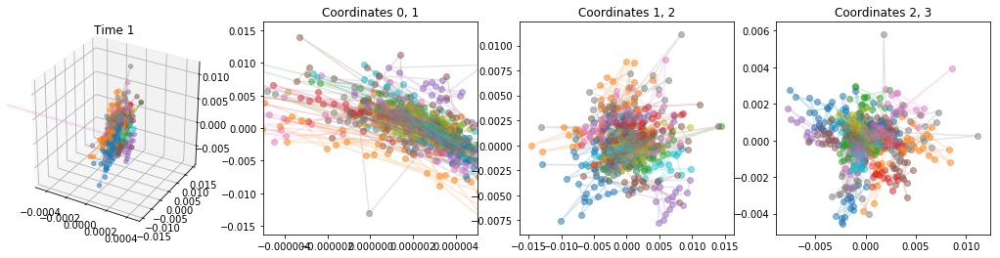

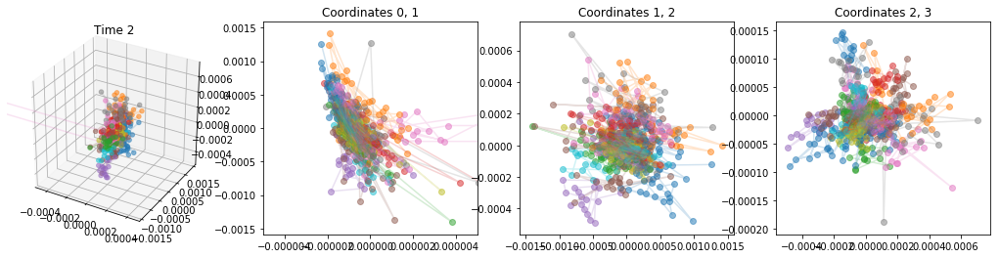

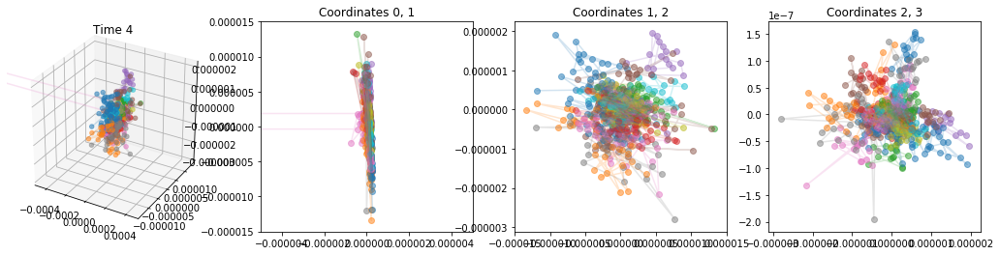

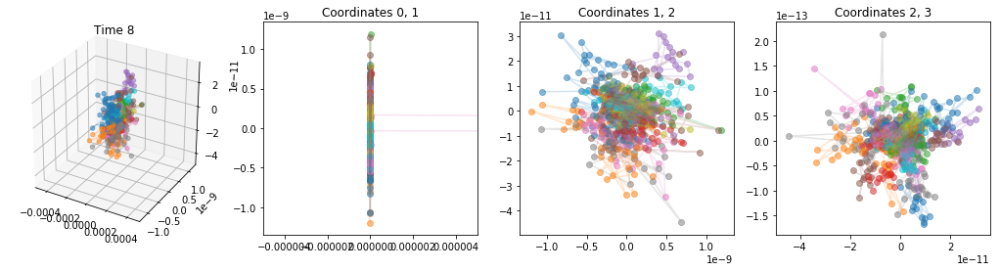

In [36]:
## Looking at differences through time: we see the points get closer together (note the change in axis scale)
# Colored by scene

for time in range(4):
    time = 2 ** time
    [dif_map, dif_vals] = diffmap(sharedscene_flat, 100, time, 4)
    
    fig = plt.figure(figsize= [18, 4])
    ax0 = fig.add_subplot(1, 4, 1, projection='3d')
    ax0.set_xlim([-0.0005, 0.0005])
    ax0.set_title("Time %d" % time)
    ax = fig.add_subplot(1, 4, 2)
    ax.set_title("Coordinates 0, 1")
    ax.set_xlim([-0.000005, 0.000005])
    ax2 = fig.add_subplot(1, 4, 3)
    ax2.set_title("Coordinates 1, 2")
    ax3 = fig.add_subplot(1, 4, 4)
    ax3.set_title("Coordinates 2, 3")
    for scene in range(nScenes): 
        idx = [int(x) for x in (np.linspace(0, np.shape(dif_map)[0], n + 1)[:-1]) + scene]

        ax0.plot(dif_map[idx, 0], dif_map[idx, 1], dif_map[idx, 2], alpha = 0.2)
        ax0.scatter(dif_map[idx, 0], dif_map[idx, 1], dif_map[idx, 2], alpha = 0.5)

        ax.plot(dif_map[idx, 0], dif_map[idx, 1], alpha = 0.2)
        ax.scatter(dif_map[idx, 0], dif_map[idx, 1], alpha = 0.5)

        ax2.plot(dif_map[idx, 1], dif_map[idx, 2], alpha = 0.2)
        ax2.scatter(dif_map[idx, 1], dif_map[idx, 2], alpha = 0.5)

        ax3.plot(dif_map[idx, 2], dif_map[idx, 3], alpha = 0.2)
        ax3.scatter(dif_map[idx, 2], dif_map[idx, 3],  alpha = 0.5)
        